<a href="https://colab.research.google.com/github/YUFULEO/Social-Network-Mining/blob/main/Project2_106181329_306294486_306183290.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Part 1: Facebook network

## (1) Structural properties of the Facebook network


### Question 1.1

In [ ]:
!pip install cairocffi
!pip install igraph

In [ ]:
import cairocffi
import igraph as ig
import matplotlib.pyplot as plt
import numpy as np
import ipywidgets as widgets
from IPython.display import display, Image
import os
from sklearn.linear_model import LinearRegression

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
g = ig.Graph.Read_Edgelist('/content/drive/MyDrive/facebook_combined.txt', directed=False)

num_nodes = g.vcount()
num_edges = g.ecount()
print(f"Number of nodes: {num_nodes}")
print(f"Number of edges: {num_edges}")

Number of nodes: 4039
Number of edges: 88234


**<font color=blue size=4>Question 1.1**

**Report the number of nodes and number of edges of the Facebook network.**

For the Facebook network, the number of nodes is 4039. The number of edges is 88234. You can see the results above.

### Question 1.2

In [ ]:
if g.is_connected():
  print('Facebook network is connected.')
else:
  gcc = g.connected_components().giant()
  print(f'The Facebook network is not connected. The size of the GCC is {gcc.vount()}')

Facebook network is connected.


**<font color=blue size=4>Question 1.2**

**Is the Facebook network connected? If not, find the giant connected component (GCC) of the network and report the size of the GCC.**

The Facebook network is connected. You can see the results above.

### Question 2

In [ ]:
if g.is_connected():
  g_diameter = g.diameter()
  print(f'Diameter of the is {g_diameter}.')
else:
  gcc = g.connected_components().giant()
  print(f'The size of the GCC is {gcc.diameter()}')

Diameter of the is 8.


**<font color=blue size=4>Question 2**

**Find the diameter of the network. If the network is not connected, then find the diameter of the GCC.**

The diameter of the network is 8. You can see the results above.

### Question 3

Average degree: 43.69101262688784


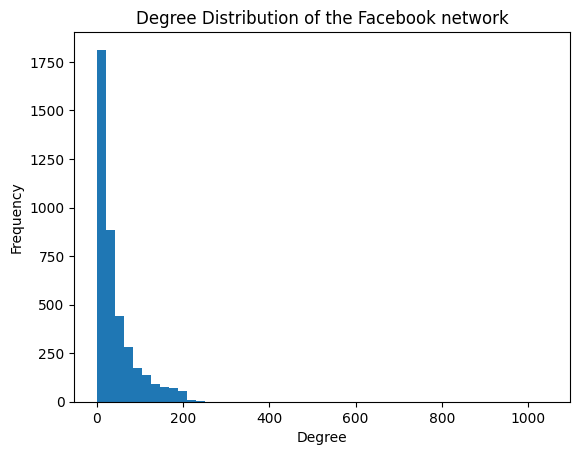

In [ ]:
d = g.degree()
print(f'Average degree: {np.mean(d)}')
plt.hist(d, bins=50)
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title(f'Degree Distribution of the Facebook network')
plt.show()

**<font color=blue size=4>Question 3**

**Plot the degree distribution of the facebook network and report the average degree.**

We plot the degree distribution of the facebook network and report the average degree. The average degree is 43.69101262688784. You can see the plot above. When degree over 200, the frequency almost 0.

### Question 4

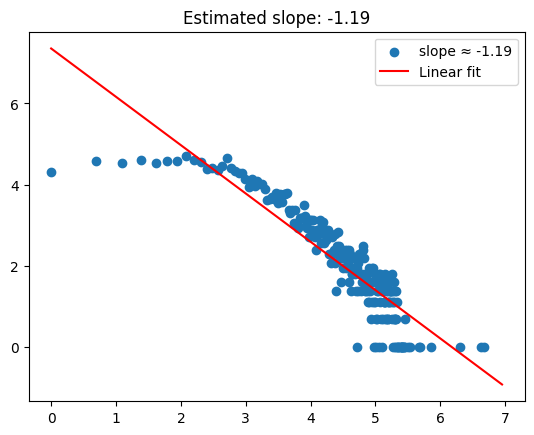

In [ ]:
d = g.degree()
counts, bins = np.histogram(d, bins = np.arange(min(d) - 0.5, max(d) + 0.5, 1))
X = np.log(np.arange(1, max(d), 1))[counts > 0]
y = np.log(counts[counts > 0])
X = X.reshape(-1, 1)
reg = LinearRegression().fit(X, y)
slope = reg.coef_[0]
intercept = reg.intercept_
plt.scatter(X, y, label=f'slope ≈ {slope:.2f}')
plt.plot(np.log(np.arange(1, max(d))), intercept + np.log(np.arange(1,max(d)))*slope, 'r', label='Linear fit')
plt.title(f'Estimated slope: {round(slope, 3)}')
plt.legend()
plt.show()

**<font color=blue size=4>Question 4**

**Plot the degree distribution of Question 3 in a log-log scale. Try to fit a line to the plot and estimate the slope of the line.**

We plot the degree distribution of Question 3 in a log-log scale. And we fit a line to the plot and estimate the slope of the line. You can see the plot above. The slop is -1.19.

## (2) Personalized network

### Question 5

In [ ]:
neighbors_id_1 = g.neighbors(0, mode = 'All')
neighbors_id_1.append(0)
network_id_1 = g.subgraph(neighbors_id_1)

In [ ]:
print(f'Number of nodes: {network_id_1.vcount()}')
print(f'Number of edges: {network_id_1.ecount()}')

Number of nodes: 348
Number of edges: 2866


**<font color=blue size=4>Question 5**

**Create a personalized network of the user whose ID is 1. How many nodes and edges does this personalized network have?**

**Hint Useful function(s): makeegograph**

We create a personalized network of the user whose ID is 1. The personalized network have 348 nodes. The personalized network have 2866 edges.

### Question 6

In [ ]:
print(f'The diameter of the personalized network is {network_id_1.diameter()}')

The diameter of the personalized network is 2


**<font color=blue size=4>Question 6**

**What is the diameter of the personalized network? Please state a trivial upper and lower bound for the diameter of the personalized network.**

The diameter of the personalized network is 2. You can see the results above. The trivial upper and lower bound for the diameter of the personalized network is [1,2], which is mean the upper bound is 2. This is because, assuming not all neighbors are physically connected, it will take at most one edge to move from the central node to any of its neighbors, and maybe another edge to move from one neighbor to another via the central node. And the lower bound is 1. This would happen if every neighbor is directly connected to every other neighbor (making the personalized network a full graph that includes the center node). In the case where the central user is directly connected to each neighbor and each neighbor is interconnected, any node (neighbor) can reach any other node in a single step.

### Question 7

**<font color=blue size=4>Question 7**

**In the context of the personalized network, what is the meaning of the diameter of the personalized network to be equal to the upper bound you derived in Question 6. What is the meaning of the diameter of the personalized network to be equal to the lower bound you derived in Question 6 (assuming there are more than 3 nodes in the personalized network)?**

In the context of the personalized network, when the diameter of the personalized network to be equal to the upper bound 2, which means that the center node is critical to linking the network. This means that each neighbor is directly connected to the center node but not necessarily to the others. This scenario often represents a "star" form or structure, with the central node serving as a hub. Each neighbor can reach another neighbor by passing via the central node, which requires two steps (edges). In social terms, a personalized network with a diameter of two indicates that, while the central individual personally communicates with each of their neighbors, the neighbors may not engage with one another without the central individual's involvement.

When the diameter of the personalized network to be equal to the lower bound 1, which means that every node in the network has a direct connection to every other node, including the central one. This transforms the personalized network into a complete graph. The graph's completeness means that the longest shortest path between any two nodes is only one edge. This means that any neighbor can communicate directly with any other neighbor, bypassing the central node. If a personalized network has a diameter of one, it represents a highly integrated group or community in which all members have direct communication with one another.

## (3) Core node’s personalized network


### Question 8

In [ ]:
d = g.degree()
d_core_nodes = [degree for degree in d if degree > 200]
num_core_nodes = len(d_core_nodes)
avg_d_core_nodes = np.mean(d_core_nodes)
print(f'There are {num_core_nodes} core nodes in the Facebook network.')
print(f'Averge degree of the core nodes: {avg_d_core_nodes}')

There are 40 core nodes in the Facebook network.
Averge degree of the core nodes: 279.375


**<font color=blue size=4>Question 8**

**How many core nodes are there in the Facebook network. What is the average degree of the core nodes?**

There are 40 core nodes in the Facebook network. And the averge degree of the core nodes is 279.375. You can see the results above.

## (3.1) Community structure of core node’s personalized network


### Question 9

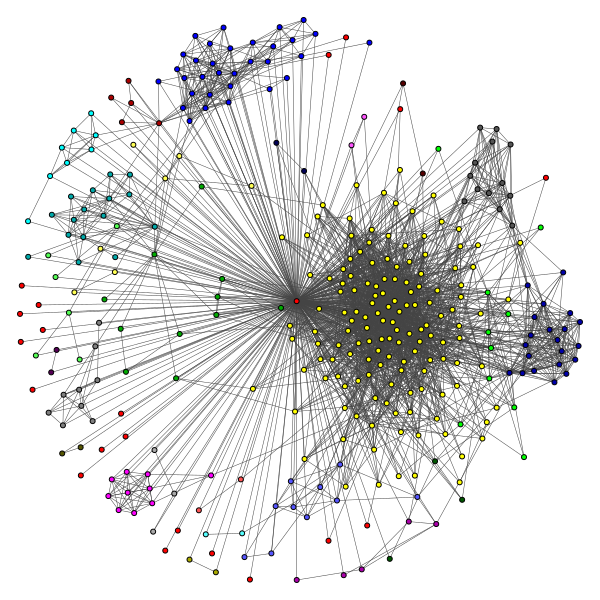

In [ ]:

communities = network_id_1.community_infomap()
clusters = communities
modularity = clusters.modularity
community_sizes = clusters.sizes()
colors = ig.drawing.colors.ClusterColoringPalette(len(clusters))
network_id_1.vs['color'] = colors.get_many(clusters.membership)

visual_style = {
  "bbox": (600, 600),
  "margin": 20,
  "vertex_size": 5,
  "edge_width": 0.5,
  "vertex_color": network_id_1.vs['color']
}
ig.plot(network_id_1, **visual_style)

Node ID: 1
With Fast-Greedy community detection algorithms:
Modularity scores: 0.4131013728342347


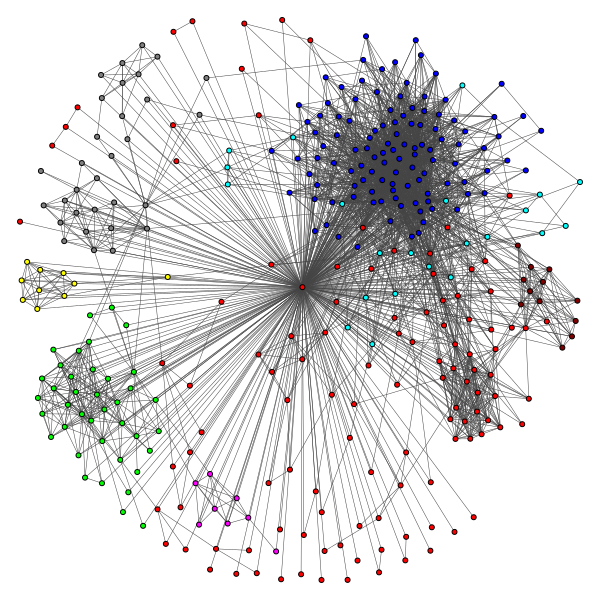

With Edge-Betweenness community detection algorithms:
Modularity scores: 0.3533021725463346


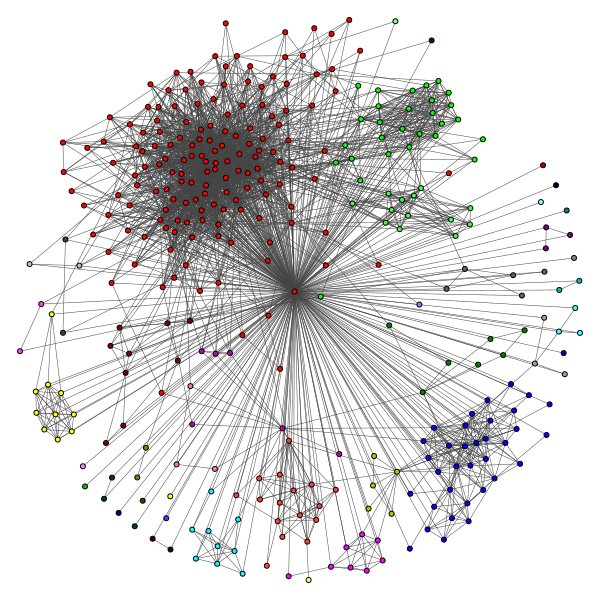

With Info-Map community detection algorithms:
Modularity scores: 0.3891184710509771


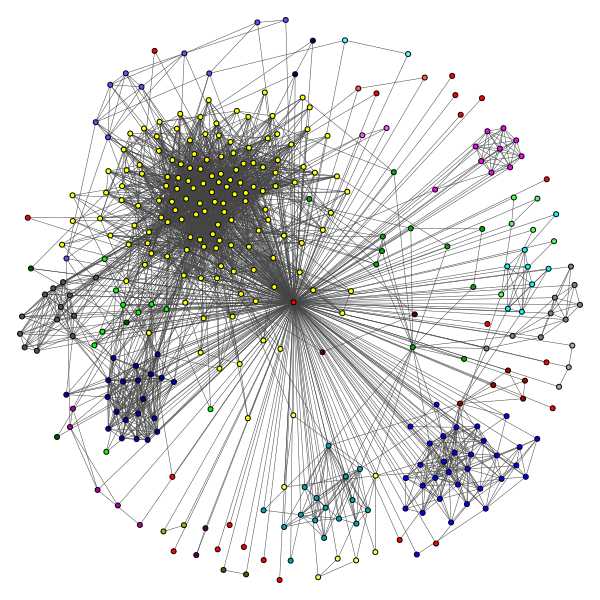

Node ID: 108
With Fast-Greedy community detection algorithms:
Modularity scores: 0.43592937602647497


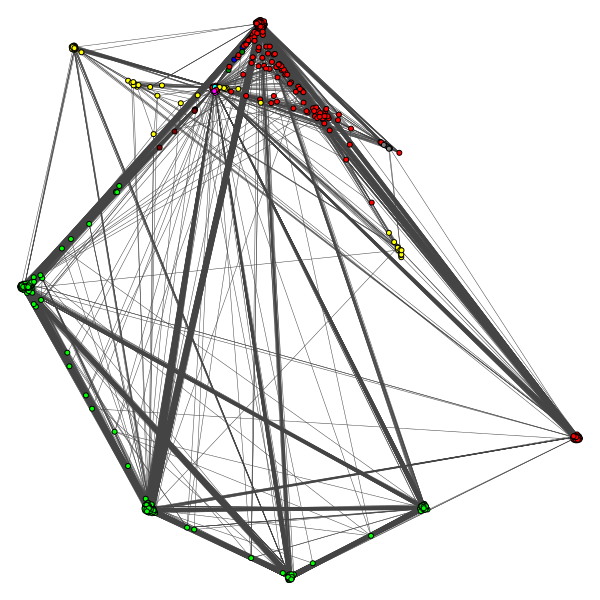

With Edge-Betweenness community detection algorithms:
Modularity scores: 0.5067549165389015


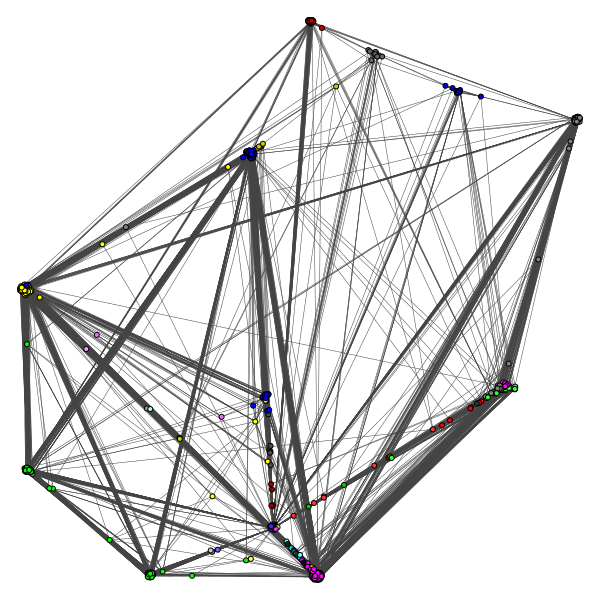

With Info-Map community detection algorithms:
Modularity scores: 0.5082233403848708


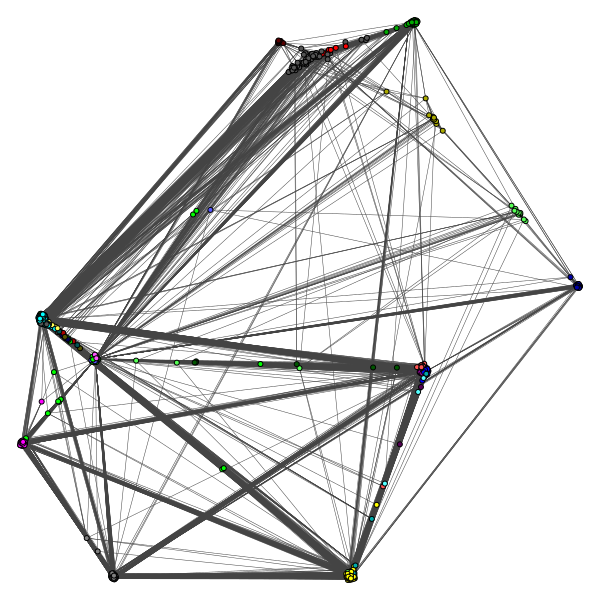

Node ID: 349
With Fast-Greedy community detection algorithms:
Modularity scores: 0.2517148585433312


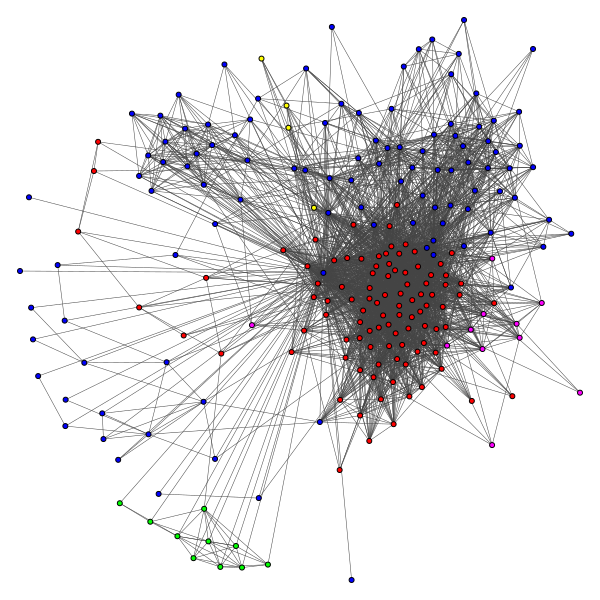

With Edge-Betweenness community detection algorithms:
Modularity scores: 0.1335280213700778


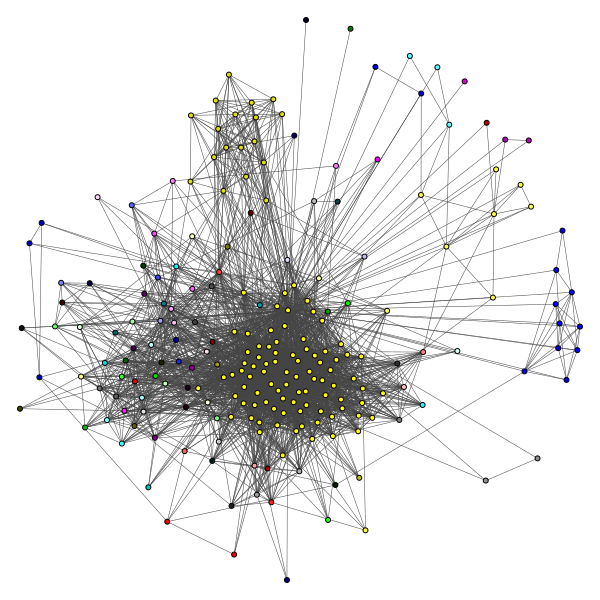

With Info-Map community detection algorithms:
Modularity scores: 0.20375299787229934


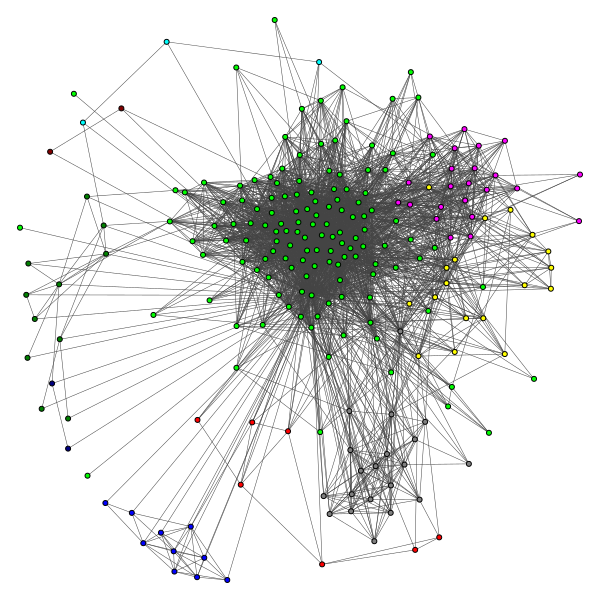

Node ID: 484
With Fast-Greedy community detection algorithms:
Modularity scores: 0.5070016421965142


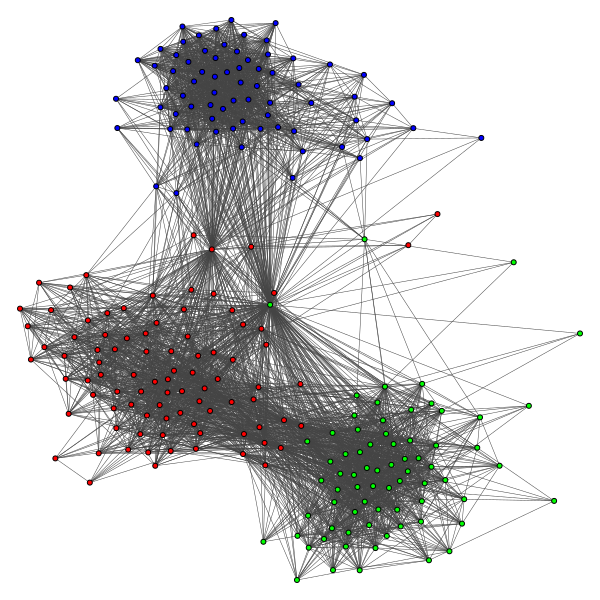

With Edge-Betweenness community detection algorithms:
Modularity scores: 0.48909518024480303


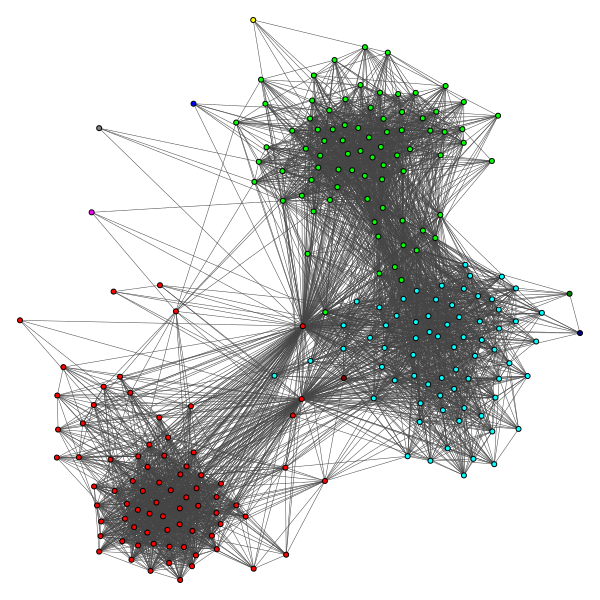

With Info-Map community detection algorithms:
Modularity scores: 0.515278752174842


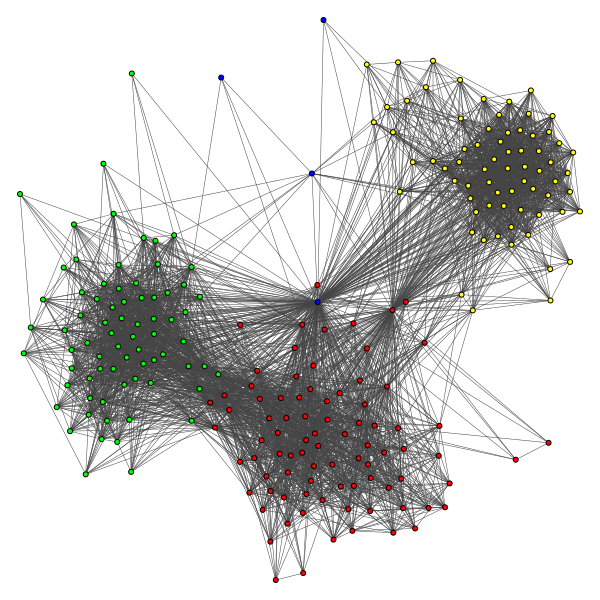

Node ID: 1087
With Fast-Greedy community detection algorithms:
Modularity scores: 0.14553149956549322


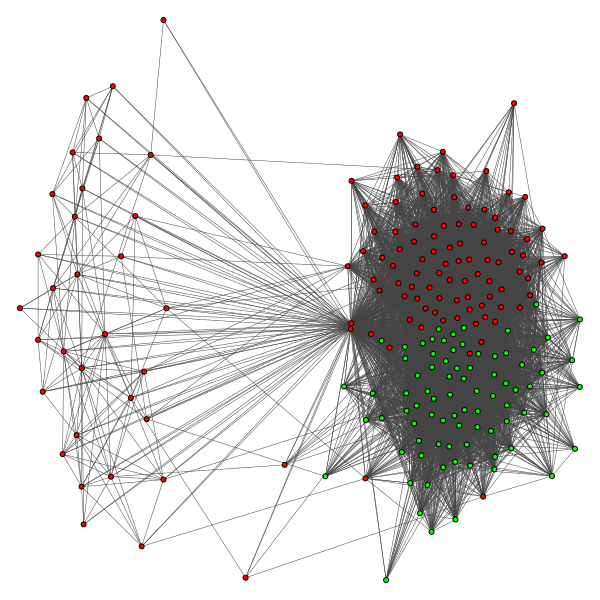

With Edge-Betweenness community detection algorithms:
Modularity scores: 0.027623772388463967


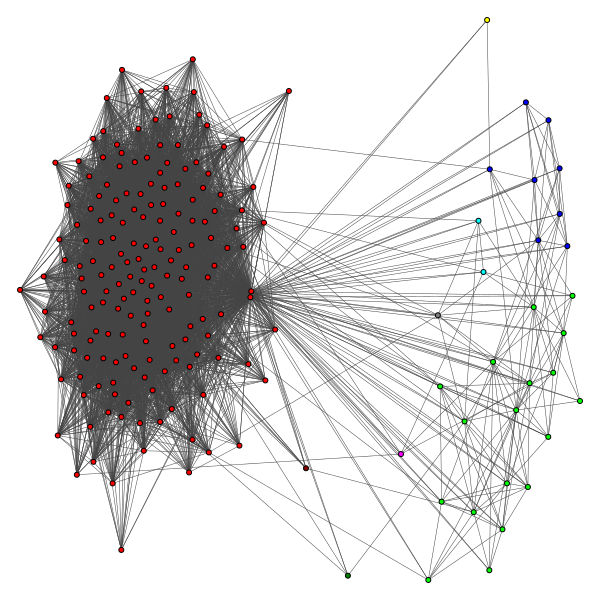

With Info-Map community detection algorithms:
Modularity scores: 0.02690661722333557


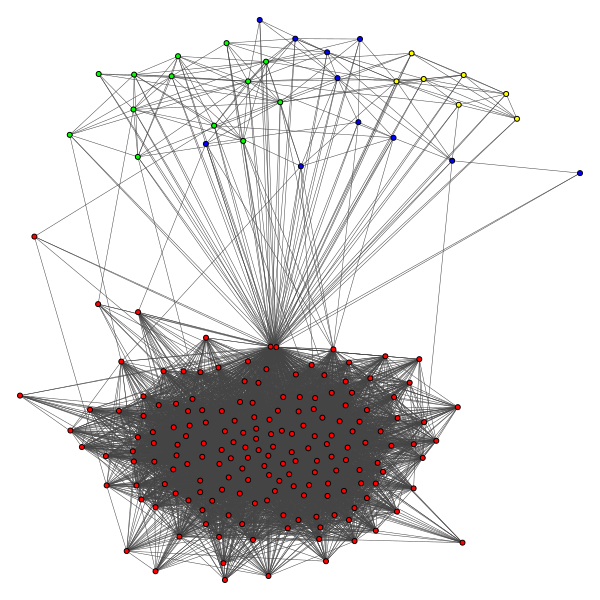

In [ ]:
core_ids = [0, 107, 348, 483, 1086]
for i in core_ids:
  print(f'Node ID: {i+1}')
  neighbors_i = g.neighbors(i, mode = 'All')
  neighbors_i.append(i)
  network_i = g.subgraph(neighbors_i)
  #fast-greedy
  print('With Fast-Greedy community detection algorithms:')
  communities = network_i.community_fastgreedy()
  clusters = communities.as_clustering()
  modularity = clusters.modularity
  print(f'Modularity scores: {modularity}')
  community_sizes = clusters.sizes()
  colors = ig.drawing.colors.ClusterColoringPalette(len(clusters))
  network_i.vs['color'] = colors.get_many(clusters.membership)
  visual_style = {
    "bbox": (600, 600),
    "margin": 20,
    "vertex_size": 5,
    "edge_width": 0.5,
    "vertex_color": network_i.vs['color']
  }
  plot_path = f"/content/graph_plot_fg.png"
  ig.plot(network_i, plot_path, **visual_style)
  display(Image(filename=plot_path))
  os.remove(plot_path)
  #edge-betweenness
  print('With Edge-Betweenness community detection algorithms:')
  communities = network_i.community_edge_betweenness()
  clusters = communities.as_clustering()
  modularity = clusters.modularity
  print(f'Modularity scores: {modularity}')
  community_sizes = clusters.sizes()
  colors = ig.drawing.colors.ClusterColoringPalette(len(clusters))
  network_i.vs['color'] = colors.get_many(clusters.membership)
  visual_style = {
    "bbox": (600, 600),
    "margin": 20,
    "vertex_size": 5,
    "edge_width": 0.5,
    "vertex_color": network_i.vs['color']
  }
  plot_path = f"/content/graph_plot_eb.png"
  ig.plot(network_i, plot_path, **visual_style)
  display(Image(filename=plot_path))
  os.remove(plot_path)
  #info-map
  print('With Info-Map community detection algorithms:')
  communities = network_i.community_infomap()
  clusters = communities
  modularity = clusters.modularity
  print(f'Modularity scores: {modularity}')
  community_sizes = clusters.sizes()
  colors = ig.drawing.colors.ClusterColoringPalette(len(clusters))
  network_i.vs['color'] = colors.get_many(clusters.membership)
  visual_style = {
    "bbox": (600, 600),
    "margin": 20,
    "vertex_size": 5,
    "edge_width": 0.5,
    "vertex_color": network_i.vs['color']
  }
  plot_path = f"/content/graph_plot_im.png"
  ig.plot(network_i, plot_path, **visual_style)
  display(Image(filename=plot_path))
  os.remove(plot_path)

**<font color=blue size=4>Question 9**

**For each of the above core node’s personalized network, find the community structure using Fast-Greedy, Edge-Betweenness, and Infomap community detection algorithms. Compare the modularity scores of the algorithms. For visualization purpose, display the community structure of the core node’s personalized networks using colors. Nodes belonging to the same community should have the same color and nodes belonging to different communities should have different color. In this question, you should have 15 plots in total.**

**Hint Useful function(s): clusterfastgreedy , clusteredgebetweenness , clusterinfomap**

For each of the above core node’s personalized network, we find the community structure using Fast-Greedy, Edge-Betweenness, and Infomap community detection algorithms. We display the community structure of the core node's personalized networks using colors. And nodes belonging to the same community have the same color and nodes belonging to different communities have different color. You can see the plots above. There are 15 plots in total. And we also compare the modularity scores of the algorithms, and we summarize in the following table:

|  (with core node) | Fast-Greedy | Edge-Betweenness  | Infomap |
| ----------------  | ------   | ----- | ----- |
| Node ID: 1   |  0.413  | 0.353  |  0.389  |
| Node ID: 108   |  0.436  | 0.507 | 0.508  |
| Node ID: 349  | 0.252| 0.134 | 0.204  |
| Node ID: 484  | 0.507 |  0.489  | 0.515  |
| Node ID: 1087  | 0.146 |  0.028 |  0.027  |

We find that Fast-Greedy algorithm have the better performance than Edge-Betweenness algorithm and Infomap algorithm, because in general, Fast-Greedy have the higher modilarity scores. But in some cases, such as when node id is 108, Edge-Betweenness algorithm and Infomap algorithm modularity score is higher than the Fast-Greedy. Also, when node id is 484, the modularity score of Informap is larger than the Fast-Greedy. Node IDs 484 and 108 have the greatest total modularity ratings across all methodologies, indicating that they belong to exceptionally well-defined communities. Node ID: 1087 has the lowest ratings, indicating that it is not strongly affiliated with any one community.

## (3.2) Community structure with the core node removed


### Question 10

Node ID: 1
With Fast-Greedy community detection algorithms:
Modularity scores: 0.44185326886839055


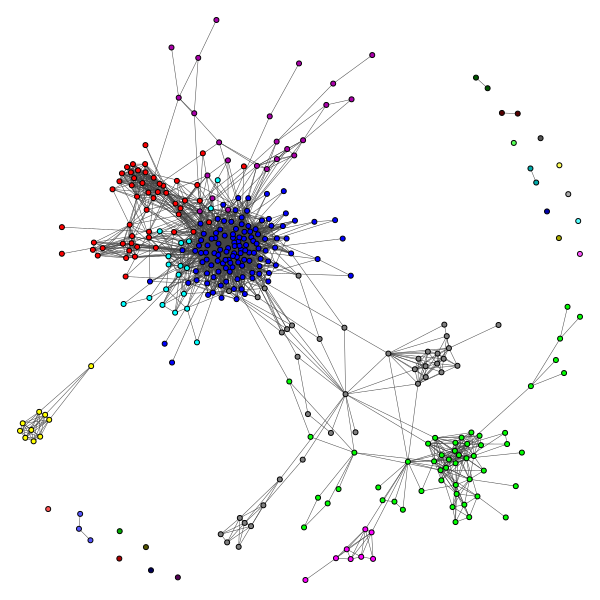

With Edge-Betweenness community detection algorithms:
Modularity scores: 0.41614614203983025


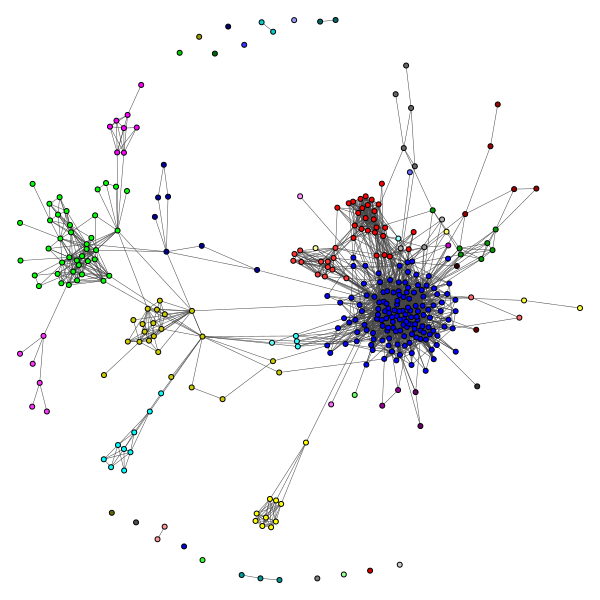

With Info-Map community detection algorithms:
Modularity scores: 0.41800765945389073


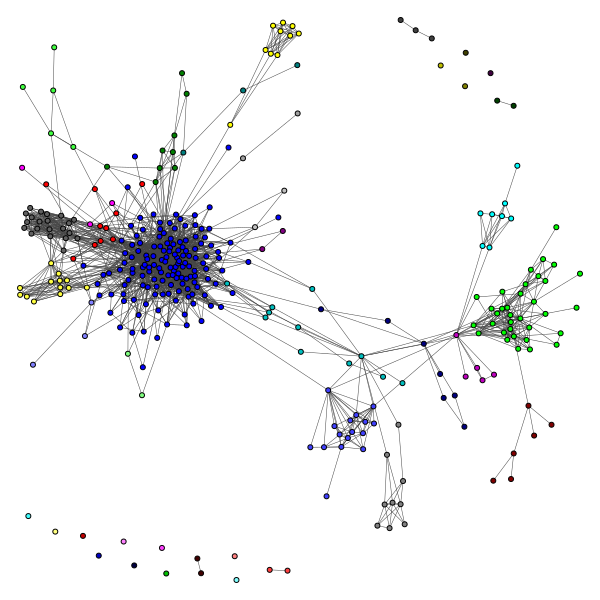

Node ID: 108
With Fast-Greedy community detection algorithms:
Modularity scores: 0.4581270937199755


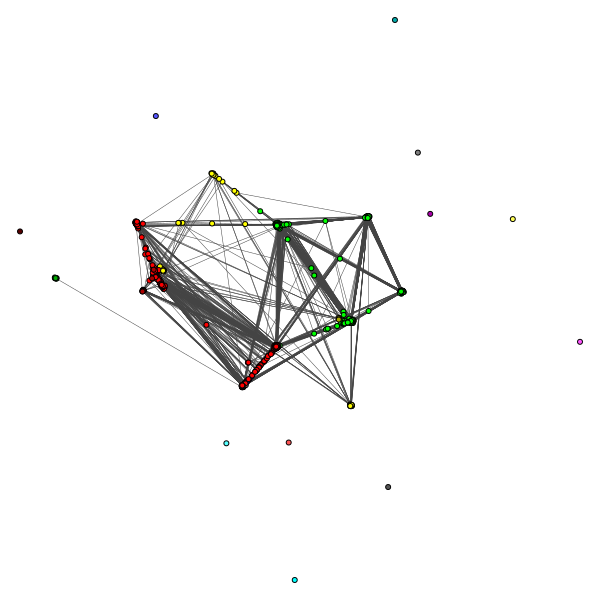

With Edge-Betweenness community detection algorithms:
Modularity scores: 0.521321576382216


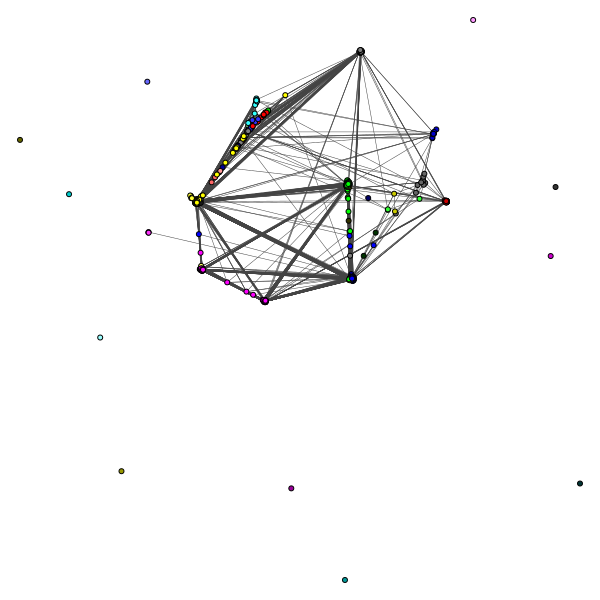

With Info-Map community detection algorithms:
Modularity scores: 0.5179495494803038


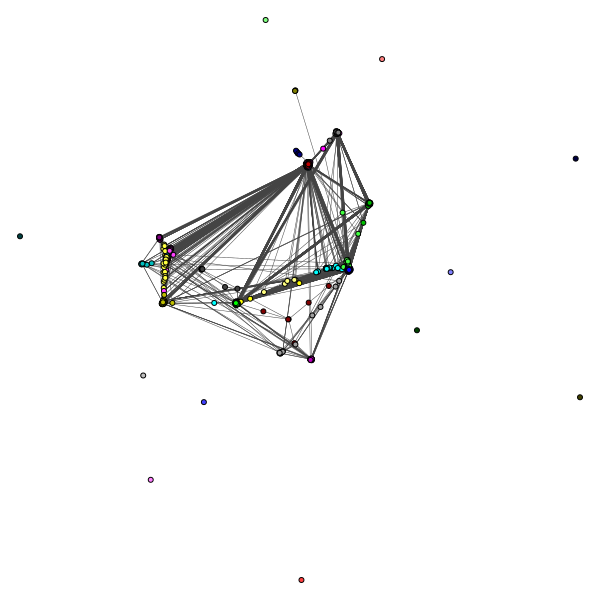

Node ID: 349
With Fast-Greedy community detection algorithms:
Modularity scores: 0.24569179594267446


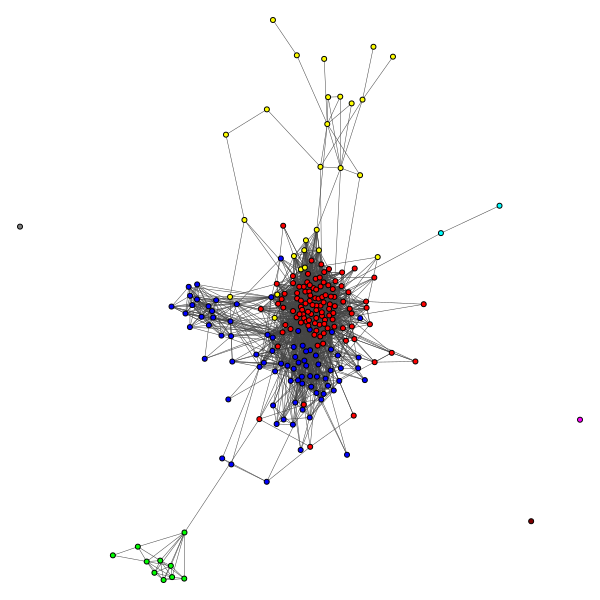

With Edge-Betweenness community detection algorithms:
Modularity scores: 0.1505663401875595


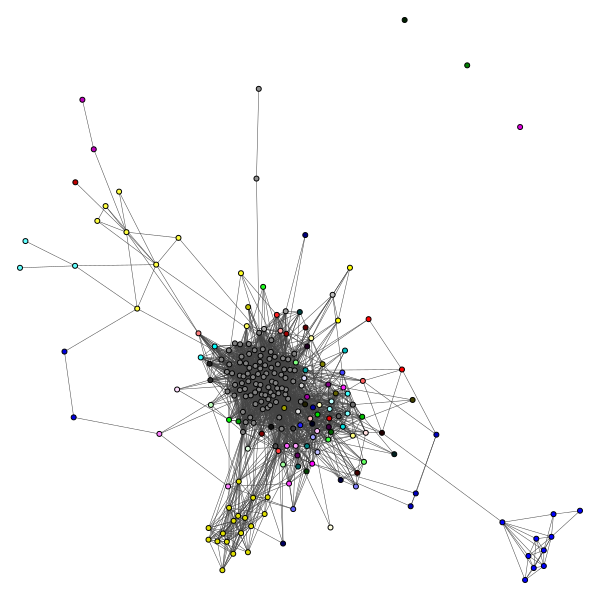

With Info-Map community detection algorithms:
Modularity scores: 0.23377319873016636


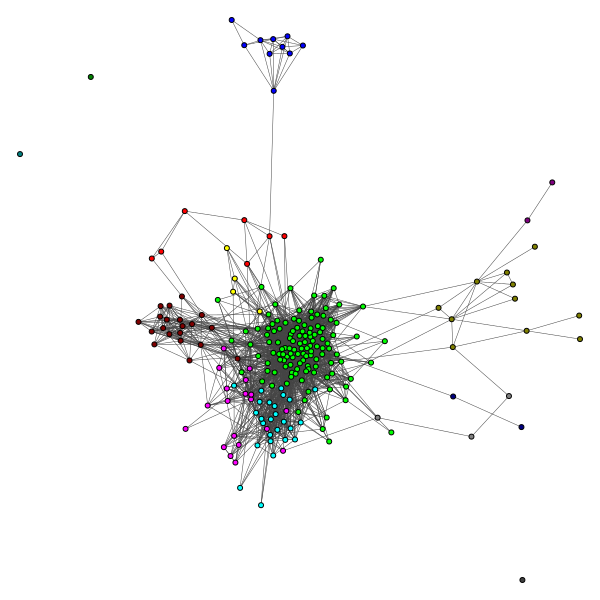

Node ID: 484
With Fast-Greedy community detection algorithms:
Modularity scores: 0.5342141546061716


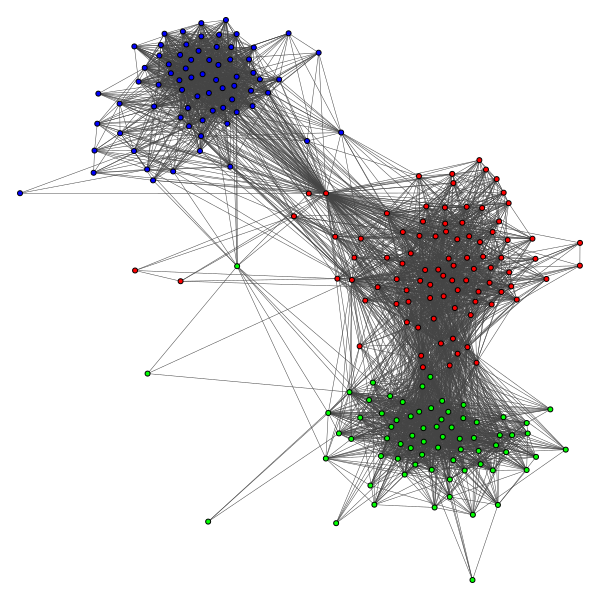

With Edge-Betweenness community detection algorithms:
Modularity scores: 0.5154412771235044


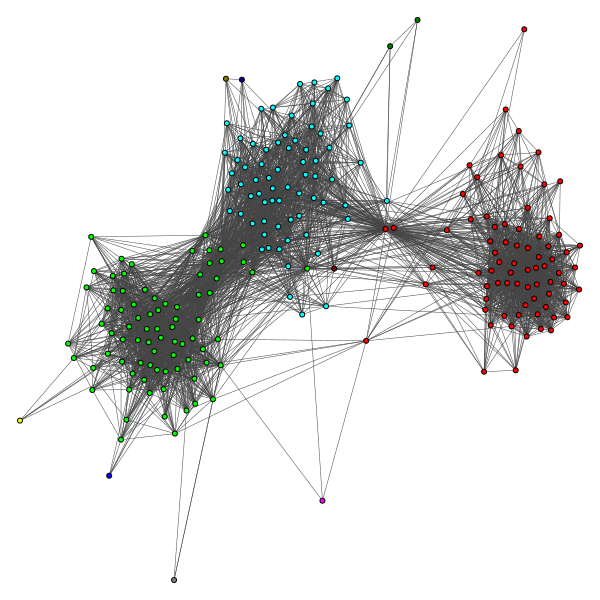

With Info-Map community detection algorithms:
Modularity scores: 0.5434436792795223


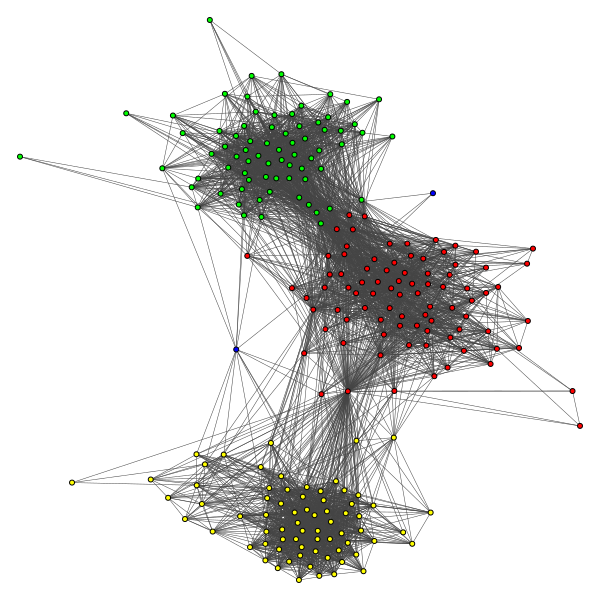

Node ID: 1087
With Fast-Greedy community detection algorithms:
Modularity scores: 0.14819563195349858


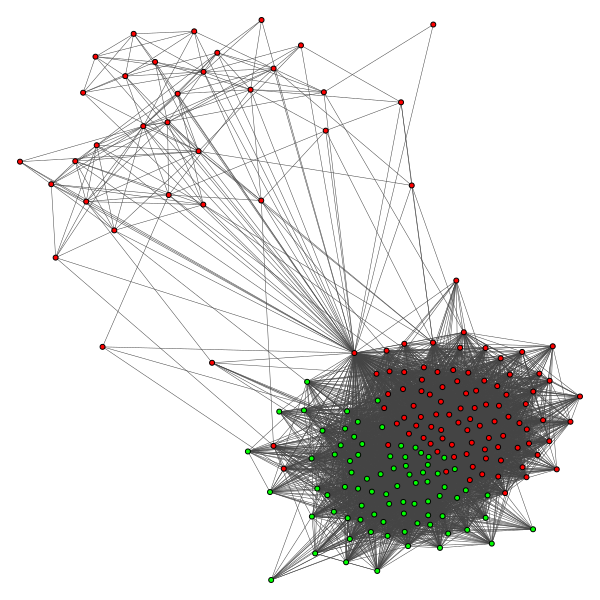

With Edge-Betweenness community detection algorithms:
Modularity scores: 0.032495298049914106


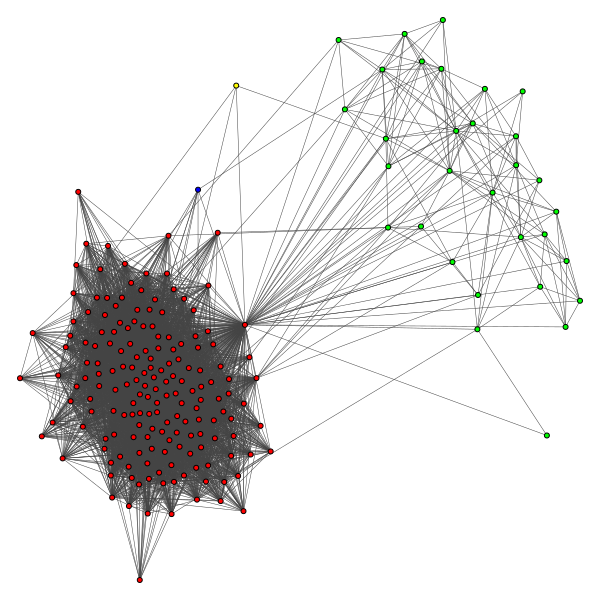

With Info-Map community detection algorithms:
Modularity scores: 0.027371594487114705


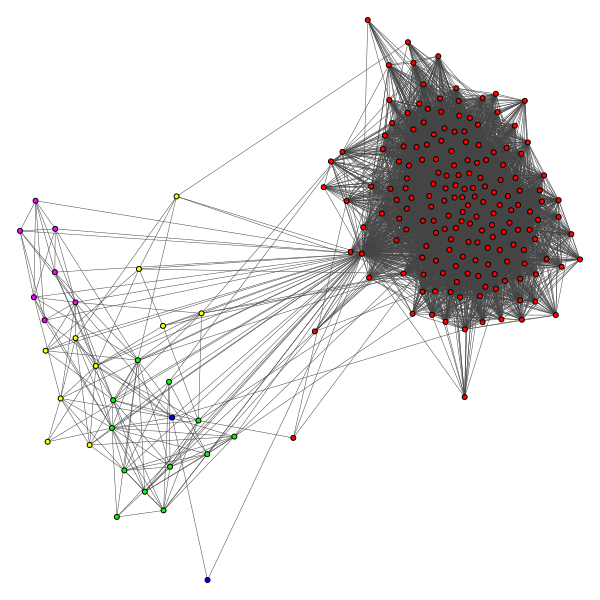

In [ ]:
core_ids = [0, 107, 348, 483, 1086]
for i in core_ids:
  print(f'Node ID: {i+1}')
  neighbors_i = g.neighbors(i, mode = 'All')
  # neighbors_i.append(i) ### core node removed
  network_i = g.subgraph(neighbors_i)
  #fast-greedy
  print('With Fast-Greedy community detection algorithms:')
  communities = network_i.community_fastgreedy()
  clusters = communities.as_clustering()
  modularity = clusters.modularity
  print(f'Modularity scores: {modularity}')
  community_sizes = clusters.sizes()
  colors = ig.drawing.colors.ClusterColoringPalette(len(clusters))
  network_i.vs['color'] = colors.get_many(clusters.membership)
  visual_style = {
    "bbox": (600, 600),
    "margin": 20,
    "vertex_size": 5,
    "edge_width": 0.5,
    "vertex_color": network_i.vs['color']
  }
  plot_path = f"/content/graph_plot_fg.png"
  ig.plot(network_i, plot_path, **visual_style)
  display(Image(filename=plot_path))
  os.remove(plot_path)
  #edge-betweenness
  print('With Edge-Betweenness community detection algorithms:')
  communities = network_i.community_edge_betweenness()
  clusters = communities.as_clustering()
  modularity = clusters.modularity
  print(f'Modularity scores: {modularity}')
  community_sizes = clusters.sizes()
  colors = ig.drawing.colors.ClusterColoringPalette(len(clusters))
  network_i.vs['color'] = colors.get_many(clusters.membership)
  visual_style = {
    "bbox": (600, 600),
    "margin": 20,
    "vertex_size": 5,
    "edge_width": 0.5,
    "vertex_color": network_i.vs['color']
  }
  plot_path = f"/content/graph_plot_eb.png"
  ig.plot(network_i, plot_path, **visual_style)
  display(Image(filename=plot_path))
  os.remove(plot_path)
  #info-map
  print('With Info-Map community detection algorithms:')
  communities = network_i.community_infomap()
  clusters = communities
  modularity = clusters.modularity
  print(f'Modularity scores: {modularity}')
  community_sizes = clusters.sizes()
  colors = ig.drawing.colors.ClusterColoringPalette(len(clusters))
  network_i.vs['color'] = colors.get_many(clusters.membership)
  visual_style = {
    "bbox": (600, 600),
    "margin": 20,
    "vertex_size": 5,
    "edge_width": 0.5,
    "vertex_color": network_i.vs['color']
  }
  plot_path = f"/content/graph_plot_im.png"
  ig.plot(network_i, plot_path, **visual_style)
  display(Image(filename=plot_path))
  os.remove(plot_path)

**<font color=blue size=4>Question 10**

**For each of the core node’s personalized network (use same core nodes as Question 9), remove the core node from the personalized network and find the community structure of the modified personalized network. Use the same community detection algorithm as Question 9. Compare the modularity score of the community structure of the modified personalized network with the modularity score of the community structure of the personalized network of Question 9. For visualization purpose, display the community structure of the modified personalized network using colors. In this question, you should have 15 plots in total.**

For each of the core node’s personalized network, we remove the core node from the personalized network and find the community structure of the modified personalized network. And we use the same community detection algorithm as Question 9. We display the community structure of the modified personalized network using colors. You can see the plots above. There are 15 plots in total. We also compare the modularity score of the community structure of the modified personalized network with the modularity score of the community structure of the personalized network of Question 9. You can see the following two tables:

|  (with core node) | Fast-Greedy | Edge-Betweenness  | Infomap |
| ----------------  | ------   | ----- | ----- |
| Node ID: 1   |  0.413  | 0.353  |  0.389  |
| Node ID: 108   |  0.436  | 0.507 | 0.508  |
| Node ID: 349  | 0.252| 0.134 | 0.204  |
| Node ID: 484  | 0.507 |  0.489  | 0.515  |
| Node ID: 1087  | 0.146 |  0.028 |  0.027  |

|  (without core node)  | Fast-Greedy | Edge-Betweenness | Infomap|
| ----------------  | ------   | ----- | ----- |
| Node ID: 1   |  0.442  | 0.416  |  0.418  |
| Node ID: 108   |  0.458  | 0.521 | 0.518  |
| Node ID: 349  | 0.246| 0.151 | 0.234  |
| Node ID: 484  | 0.534 |  0.515 | 0.543  |
| Node ID: 1087  | 0.148 |  0.032 |  0.027  |

We find that the modularity scores of the personalized network without core node are higher than the modilarity scores of the personalized network with core node. The reason may be the core node could serve as a link between several communities. When it is present, the communities become less separate because it fosters relationships among them. Its disappearance further divides these communities, increasing modularity. Also, without the core node, edges that were formerly connected to it may redistribute among the other nodes, strengthening the community structure. We also find that even the modularity scores are increased, the scores are only increase a little, which means that the range of the score is small.

## (3.3)  Characteristic of nodes in the personalized network


### Question 11

**<font color=blue size=4>Question 11**

**Write an expression relating the Embeddedness between the core node and a non-core node to the degree of the non-core node in the personalized network of the core node.**

Embeddedness is a social network analysis concept that describes the degree to which two nodes share common neighbors. Firstly, we will assume that $v_i$ is the core node, and $v_j$ is the non-core node. And $E(v_i, v_j)$ as the embeddedness of node $v_i$ with respect to another node $v_j$. $k(v_j)$ as the degree of the non-core node $v_j$ within the personalized network of the core node $v_i$. So the expression is: $E(v_i, v_j) = k(v_j) - 1$. The degree should minus one because the degree includes the core node as a neighbor, which is a common scenario in personalized networks, and it should get the number of neighbors other than the core node.


### Question 12

In [ ]:
def embeddedness(g, core_node, non_core_node):
  neighbors_core_node = g.neighbors(core_node, mode = 'All')
  neighbors_non_core_node = g.neighbors(non_core_node, mode = 'All')
  mutual_friends = set(neighbors_core_node).intersection(neighbors_non_core_node)
  return len(mutual_friends)

def dispersion(g, core_node, non_core_node):
  neighbors_core_node = g.neighbors(core_node, mode = 'All')
  neighbors_non_core_node = g.neighbors(non_core_node, mode = 'All')
  mutual_friends = set(neighbors_core_node).intersection(neighbors_non_core_node)
  subgraph = g.subgraph(mutual_friends)
  distances = []
  for i in range(len(mutual_friends) - 1):
    for j in range(i + 1, len(mutual_friends)):
      d = subgraph.distances(i, j)[0][0]
      if d < float('inf'):
        distances.append(d)
      else:
        distances.append(0)
  return sum(distances)

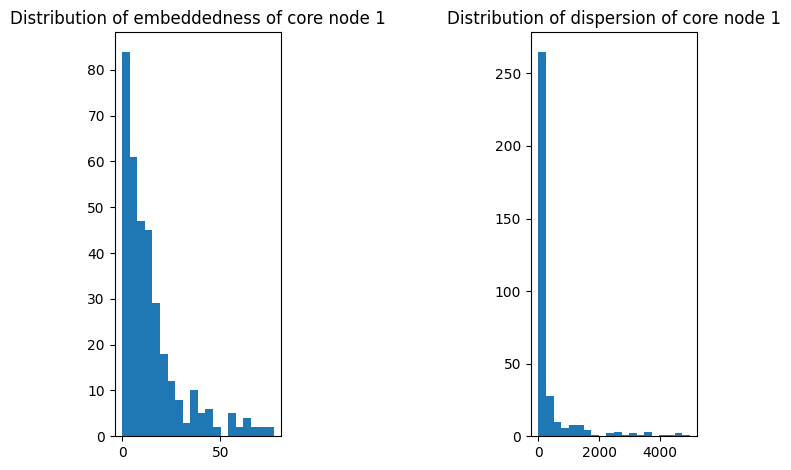

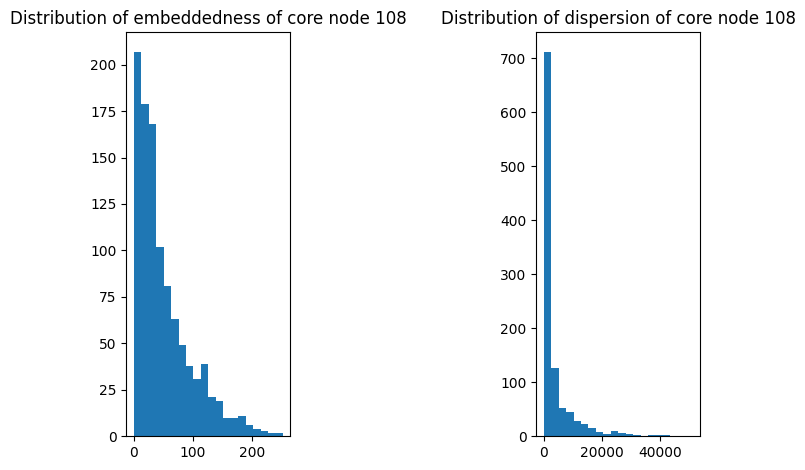

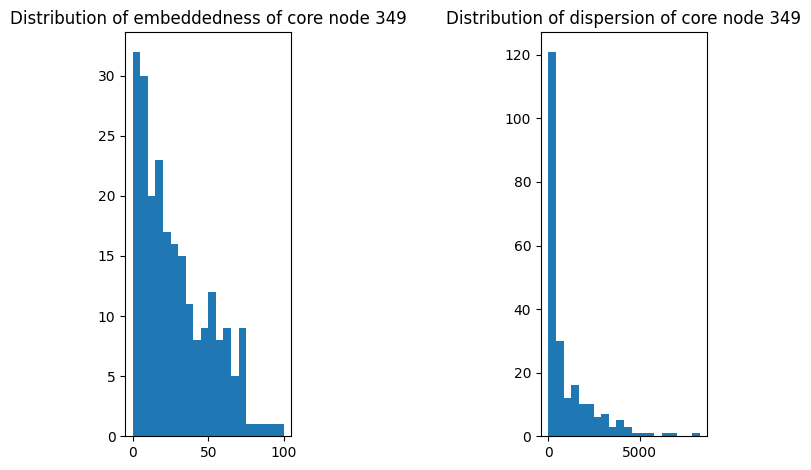

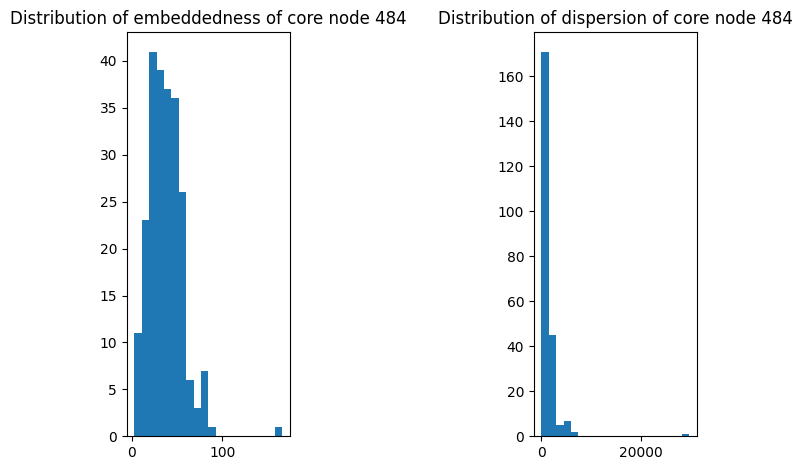

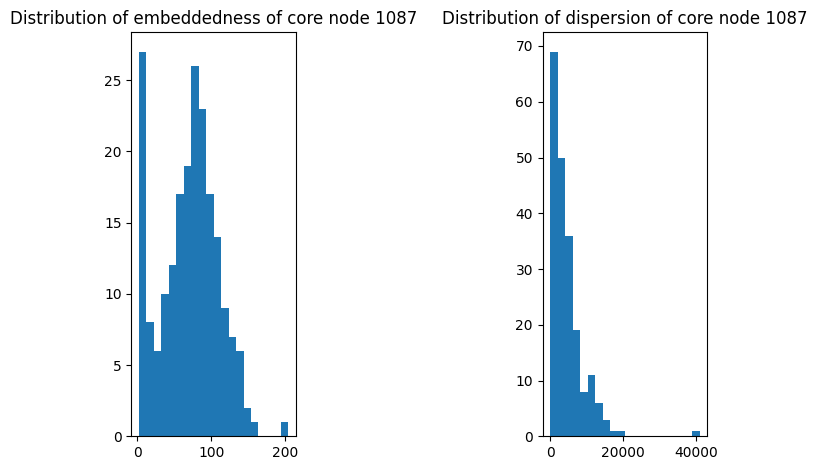

In [ ]:
core_ids = [0, 107, 348, 483, 1086]
for core_node in core_ids:
  neighbors_core_node = g.neighbors(core_node)
  embeddedness_ls = [embeddedness(g, core_node, neighbor) for neighbor in neighbors_core_node]
  dispersion_ls = [dispersion(g, core_node, neighbor) for neighbor in neighbors_core_node]
  fig, axs = plt.subplots(1, 2)

  axs[0].hist(embeddedness_ls, bins=20, log=False)
  axs[0].set_title(f'Distribution of embeddedness of core node {core_node + 1}')

  axs[1].hist(dispersion_ls, bins=20, log=False)
  axs[1].set_title(f'Distribution of dispersion of core node {core_node + 1}')

  plt.tight_layout()
  fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=1.5, hspace=None)

**<font color=blue size=4>Question 12**

**For each of the core node’s personalized network (use the same core nodes as Question 9), plot the distribution histogram of embeddedness and dispersion. In this question, you will have 10 plots.**

**Hint Useful function(s): neighbors , intersection , distances**

For each of the core node’s personalized network, we plot the distribution histogram of embeddedness and dispersion. You can see the plots above. There are 10 plots in total. We find that the distribution of embeddedness of core node 108 and 1087 are larger than other three with maximum number over 200. In other words, the nodes in these two personalied network is closer, and also means that they have a greater number of shared connections or mutual friends. Also, a high level of embeddedness contributes to the stability and robustness of social networks.

In the context of social network analysis, dispersion often refers to the amount to which a node's ties are disseminated over different portions of the network, or how evenly a person's friends are distributed among different social circles. For the dispersion, the distribution of dispersion of core node 108, 484, and 1087 are larger than other three with maximum number over 30000. Which means that instead of being limited to a single close-knit community, the individual has ties in a variety of social circles. Their pals are not all related to one another and belong to several organizations.

### Question 13

Node ID: 1
Node 56 has the highest dispersion.


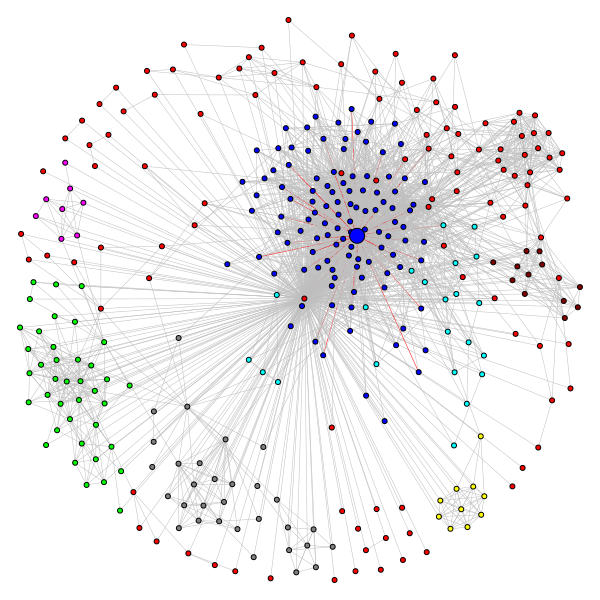

Node ID: 108
Node 1888 has the highest dispersion.


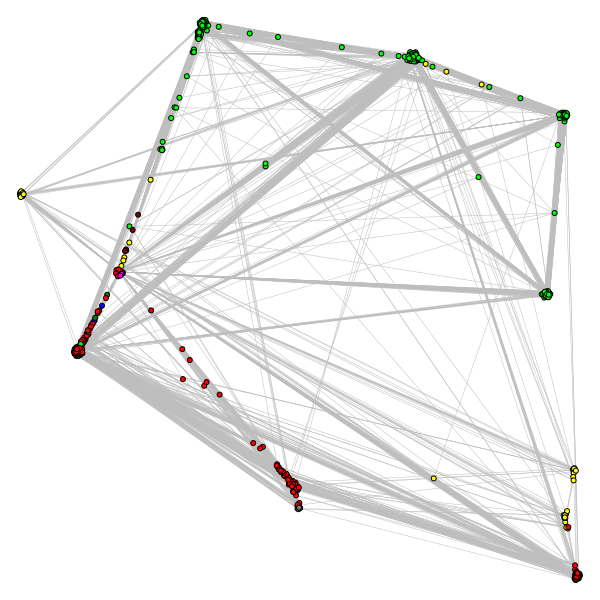

Node ID: 349
Node 376 has the highest dispersion.


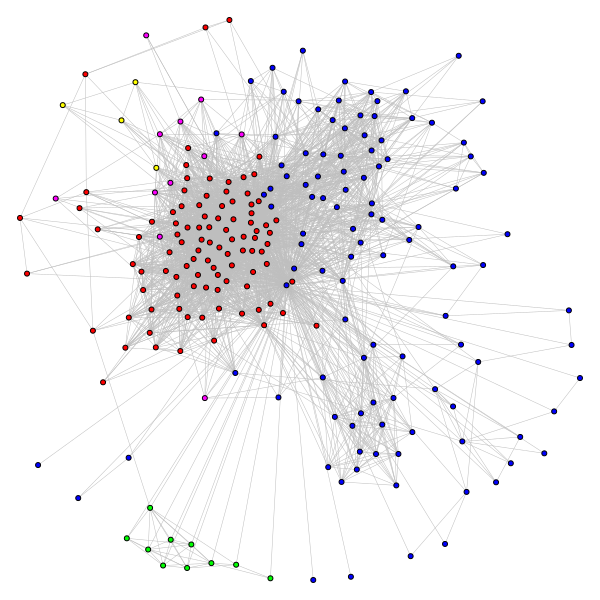

Node ID: 484
Node 107 has the highest dispersion.


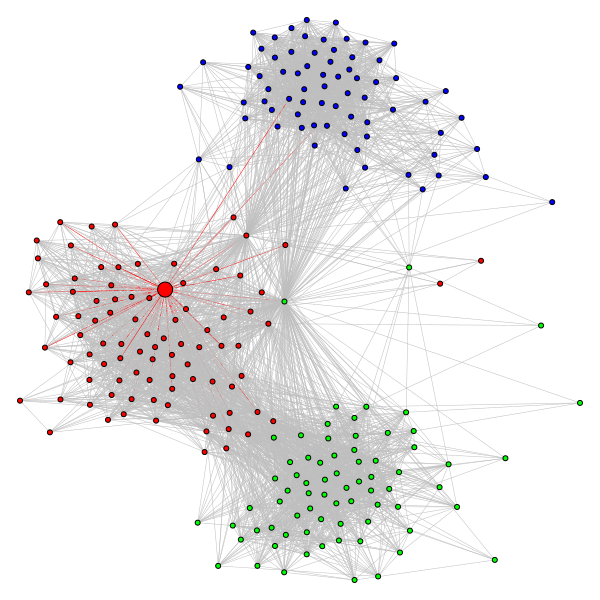

Node ID: 1087
Node 107 has the highest dispersion.


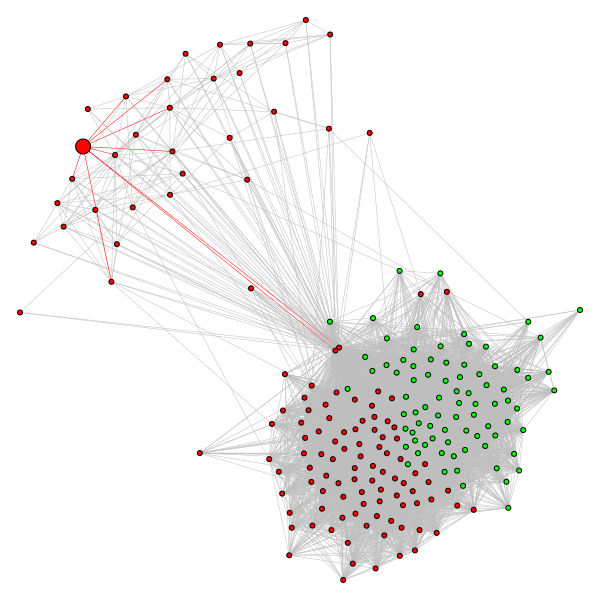

In [ ]:
core_ids = [0, 107, 348, 483, 1086]
for core_node in core_ids:
  print(f'Node ID: {core_node+1}')
  neighbors_i = g.neighbors(core_node, mode = 'All')
  dispersion_ls = [dispersion(g, core_node, neighbor) for neighbor in neighbors_i]
  max_dispersion_index = dispersion_ls.index(max(dispersion_ls))
  node_max_dispersion = neighbors_i[max_dispersion_index]
  print(f'Node {node_max_dispersion} has the highest dispersion.')
  neighbors_i.append(core_node)
  network_i = g.subgraph(neighbors_i)

  #fast-greedy
  communities = network_i.community_fastgreedy()
  clusters = communities.as_clustering()
  community_sizes = clusters.sizes()
  colors = ig.drawing.colors.ClusterColoringPalette(len(clusters))
  network_i.vs['color'] = colors.get_many(clusters.membership)
  network_i.vs['size'] = [15 if node.index == node_max_dispersion else 5 for node in network_i.vs]
  edge_colors = ['red' if node_max_dispersion in edge else 'grey' for edge in network_i.get_edgelist()]
  visual_style = {
    "bbox": (600, 600),
    "margin": 20,
    "vertex_size": network_i.vs['size'],
    "edge_width": 0.5,
    "edge_color": edge_colors,
    "vertex_color": network_i.vs['color']
  }
  plot_path = f"/content/graph_plot_fg.png"
  ig.plot(network_i, plot_path, **visual_style)
  display(Image(filename=plot_path))
  os.remove(plot_path)

**<font color=blue size=4>Question 13**

**For each of the core node’s personalized network, plot the community structure of the personalized network using colors and highlight the node with maximum dispersion. Also, highlight the edges incident to this node. To detect the community structure, use Fast-Greedy algorithm. In this question, you will have 5 plots.**

For each of the core node’s personalized network, we plot the community structure of the personalized network using colors and highlight the node with maximum dispersion. We also highlight the edges incident to this node. We use Fast-Greedy algorithm in the question. You can see the plots above. There are 5 plots in total. When Node ID is 1, node 56 has the highest dispersion. When Node ID is 108, node 1888 has the highest dispersion. When Node ID is 349, node 376 has the highest dispersion. When Node ID is 484, node 107 has the highest dispersion. When Node ID is 1087, node 107 has the highest dispersion.

### Question 14

Node ID: 1
Node 1 has the highest Embeddedness.
Node 26 has the highest dispersion-embeddedness ratio.


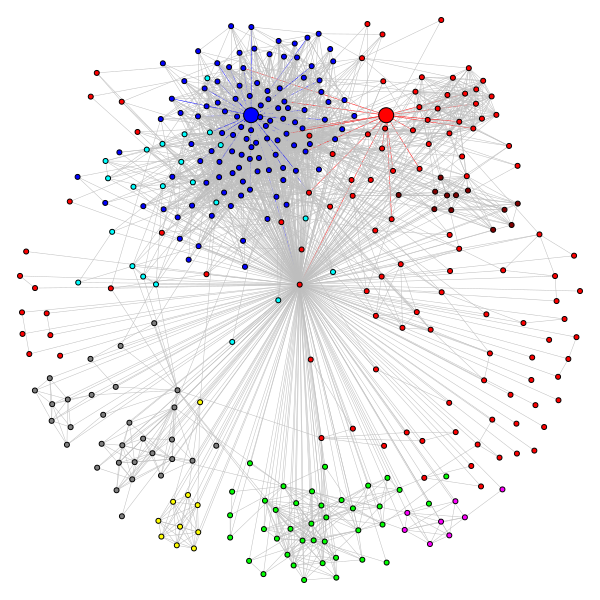

Node ID: 108
Node 0 has the highest Embeddedness.
Node 896 has the highest dispersion-embeddedness ratio.


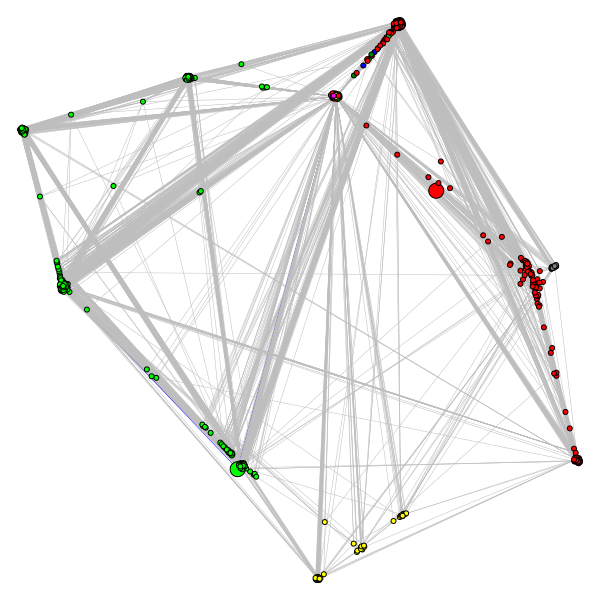

Node ID: 349
Node 34 has the highest Embeddedness.
Node 507 has the highest dispersion-embeddedness ratio.


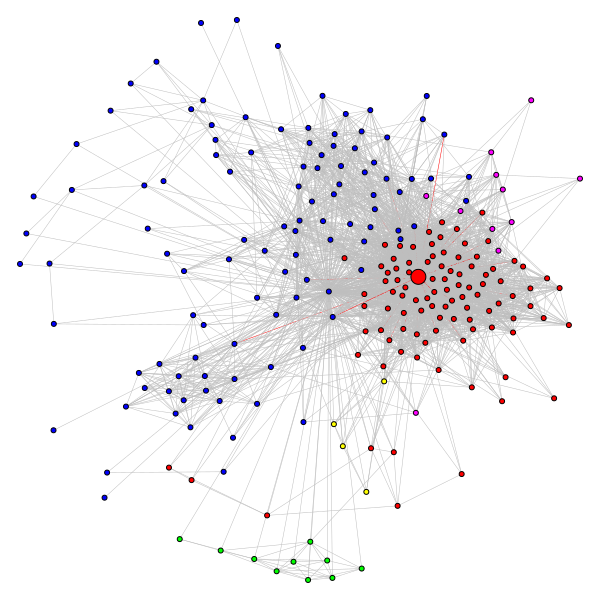

Node ID: 484
Node 107 has the highest Embeddedness.
Node 353 has the highest dispersion-embeddedness ratio.


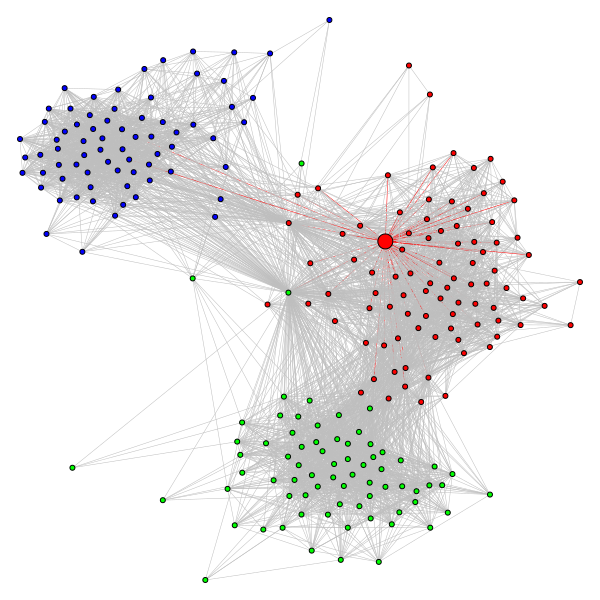

Node ID: 1087
Node 107 has the highest Embeddedness.
Node 107 has the highest dispersion-embeddedness ratio.


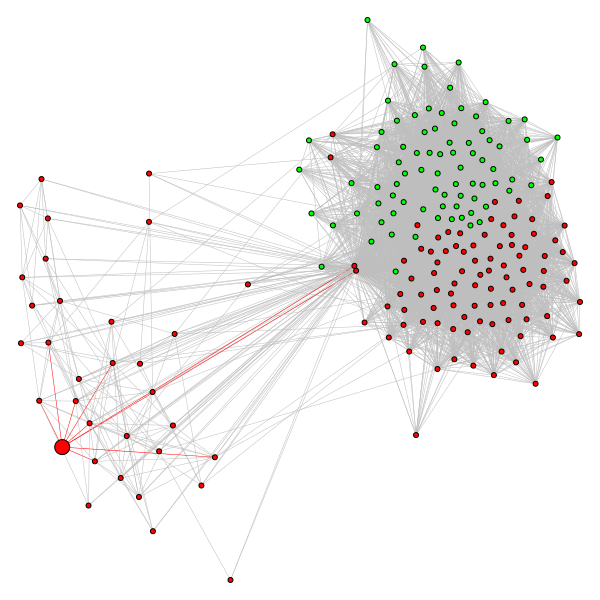

In [ ]:
core_ids = [0, 107, 348, 483, 1086]
for core_node in core_ids:
  print(f'Node ID: {core_node+1}')
  neighbors_i = g.neighbors(core_node, mode = 'All')
  embeddedness_ls_ls = [embeddedness(g, core_node, neighbor) for neighbor in neighbors_i]
  dispersion_ls = [dispersion(g, core_node, neighbor) for neighbor in neighbors_i]
  embed_disp_ratio_ls = [0 if embed == 0 else disp / embed for embed, disp in zip(embeddedness_ls, dispersion_ls)]
  max_embed_index = embeddedness_ls.index(max(embeddedness_ls))
  max_ratio_index = embed_disp_ratio_ls.index(max(embed_disp_ratio_ls))
  node_max_embed = neighbors_i[max_embed_index]
  node_max_ratio = neighbors_i[max_ratio_index]
  print(f'Node {node_max_embed} has the highest Embeddedness.')
  print(f'Node {node_max_ratio} has the highest dispersion-embeddedness ratio.')
  neighbors_i.append(core_node)
  network_i = g.subgraph(neighbors_i)

  #fast-greedy
  communities = network_i.community_fastgreedy()
  clusters = communities.as_clustering()
  community_sizes = clusters.sizes()
  colors = ig.drawing.colors.ClusterColoringPalette(len(clusters))
  network_i.vs['color'] = colors.get_many(clusters.membership)
  network_i.vs['size'] = [15 if node.index == node_max_embed or node.index == node_max_ratio else 5 for node in network_i.vs]
  edge_colors = ['red' if node_max_embed in edge else 'blue' if node_max_ratio in edge else 'grey' for edge in network_i.get_edgelist()]
  visual_style = {
    "bbox": (600, 600),
    "margin": 20,
    "vertex_size": network_i.vs['size'],
    "edge_width": 0.5,
    "edge_color": edge_colors,
    "vertex_color": network_i.vs['color']
  }
  plot_path = f"/content/graph_plot_fg.png"
  ig.plot(network_i, plot_path, **visual_style)
  display(Image(filename=plot_path))
  os.remove(plot_path)

**<font color=blue size=4>Question 14**

**Repeat Question 13, but now highlight the node with maximum embeddedness and the node with maximum dispersion/embeddedness (excluding the nodes having zero embeddedness if there are any). Also, highlight the edges incident to these nodes. Report the id of those nodes.**

For each of the core node’s personalized network, we plot the community structure of the personalized network using colors and highlight the node with maximum embeddedness and the node with maximum dispersion/embeddedness. We also highlight the edges incident to these nodes. You can see the plots above. There are 5 plots in total. When Node ID is 1, node 1 has the highest Embeddedness.And Node 26 has the highest dispersion-embeddedness ratio. When Node ID is 108, node 0 has the highest Embeddedness. Node 896 has the highest dispersion-embeddedness ratio. When Node ID is 349, node 34 has the highest Embeddedness. Node 507 has the highest dispersion-embeddedness ratio. When Node ID is 484, node 107 has the highest Embeddedness. Node 353 has the highest dispersion-embeddedness ratio. When Node ID is 1087, node 107 has the highest Embeddedness. Node 107 has the highest dispersion-embeddedness ratio.

### Question 15

**<font color=blue size=4>Question 15**

**Use the plots from Question 13 and 14 to explain the characteristics of a node revealed by each of this measure.**



*   Nodes with Maximum Dispersion: Firstly, the nodes rather than being a part of a single, tight-knit community, maintain a diverse set of casual relationships. These nodes serve as bridges or gatekeepers, connecting areas of the network that would otherwise be isolated. Also, these nodes can access a wide range of information and resources from throughout the network.

*   Nodes with Maximum Embeddedness: The nodes are part of a dense community in which everyone is well-connected. Also, they have strong local relationships and high levels of trust in their community. At last, because of their trust and amount of connections, these nodes may wield significant power in their communities.

*   Nodes with the Highest Dispersion-Embeddedness Ratio: A high dispersion to embeddedness ratio indicates that, while the node may have many connections across the network (dispersion), those connections do not always interlink to form a cohesive community (lower embeddedness). The node connects various portions of the network without necessarily creating a close-knit group. The node's connections may be versatile, having the ability to connect and gather diverse information or facilitate various interactions.




## (4)  Friend recommendation in personalized networks


## (4.1)  Neighborhood based measure


## (4.2)  Friend recommendation using neighborhood based measures



## (4.3)  Creating the list of users


### Question 16

In [ ]:
core_node = 414
neighbors_i = g.neighbors(core_node, mode = 'All')
neighbors_i.append(core_node)
network_i = g.subgraph(neighbors_i)
degrees = network_i.degree()
N_r = [i.index for i in np.array(network_i.vs)[np.array(degrees) == 24]]
print(f'The length of list Nr is {len(N_r)}.')

The length of list Nr is 11.


**<font color=blue size=4>Question 16**

**What is |Nr|, i.e. the length of the list Nr?**

For the question, we create the list of users who we want to recommend new friends to. Then we create this list by picking all nodes with degree 24.
We will denote this list as $Nr$. And having defined the friend recommendation procedure, we apply it to the personalized network of node ID 415. And we find that the length of list Nr is 11. You can see the results above.

## (4.4)  Average accuracy of friend recommendation algorithm


### Question 17

In [ ]:
def sim_common_neighbors(personalized_network, i, j):
  S_i = set(personalized_network.neighbors(i))
  S_j = set(personalized_network.neighbors(j))
  return len(S_i.intersection(S_j))

def sim_jaccard(personalized_network, i, j):
  S_i = set(personalized_network.neighbors(i))
  S_j = set(personalized_network.neighbors(j))
  if len(S_i.union(S_j)) == 0:
    return 0
  return len(S_i.intersection(S_j)) / len(S_i.union(S_j))

def sim_adamic_adar(personalized_network, i, j):
  S_i = set(personalized_network.neighbors(i))
  S_j = set(personalized_network.neighbors(j))
  k = S_i.intersection(S_j)
  sim = 0
  for node in k:
    degree = personalized_network.degree(node)
    if degree > 1:
      sim += 1 / np.log(personalized_network.degree(node))
  return sim

def recommend(personalized_network, sim, node_i, not_i_neighbor_ls, top_t):
  sims = [(sim(personalized_network, node_i, node_j), node_j) for node_j in not_i_neighbor_ls]
  sims.sort(key = lambda x: x[0], reverse = True)
  recom_ls = [i[1] for i in sims][:top_t]
  return recom_ls


In [ ]:
def randomly_remove_edge(personalized_network, i):
  neighbors_i = personalized_network.neighbors(i)
  R_i = [] # friends deleted
  for neighbor in personalized_network.neighbors(i):
    chance = np.random.random()
    if chance <= 0.25: # delete
      R_i.append(neighbor)
      neighbors_i.remove(neighbor)
      personalized_network.delete_edges([i, neighbor])
  return neighbors_i, R_i

def compute_average_accuracy(personalized_network, node_i, sim):
  accuracies = []
  for _ in range(10):
    g_temp = personalized_network.copy()
    neighbors_i, R_i = randomly_remove_edge(g_temp, node_i)
    not_i_neighbor_ls = set(g_temp.vs.indices) - set(neighbors_i) - {node_i}
    top_t = len(R_i)
    recom_ls = recommend(g_temp, sim, node_i, not_i_neighbor_ls, top_t)
    accuracy = len(set(recom_ls).intersection(R_i)) / len(R_i) if R_i else 0
    accuracies.append(accuracy)
  return np.mean(accuracies)

In [ ]:
accuracy_common_neighbors = []
accuracy_jaccard = []
accuracy_adamic_adar = []
for node_i in N_r:
  accuracy_common_neighbors.append(compute_average_accuracy(network_i, node_i, sim_common_neighbors))
  accuracy_jaccard.append(compute_average_accuracy(network_i, node_i, sim_jaccard))
  accuracy_adamic_adar.append(compute_average_accuracy(network_i, node_i, sim_adamic_adar))

In [ ]:
print(f'The averge accuracy of the algorithm using Common Neighbors similarity is {np.mean(accuracy_common_neighbors)}.')
print(f'The averge accuracy of the algorithm using Jaccard similarity is {np.mean(accuracy_jaccard)}.')
print(f'The averge accuracy of the algorithm using Adamic Adar similarity is {np.mean(accuracy_adamic_adar)}.')

The averge accuracy of the algorithm using Common Neighbors similarity is 0.825334841925751.
The averge accuracy of the algorithm using Jaccard similarity is 0.7933867899776991.
The averge accuracy of the algorithm using Adamic Adar similarity is 0.8376226551226551.


**<font color=blue size=4>Question 17**

**Compute the average accuracy of the friend recommendation algorithm that uses:**

**• Common Neighbors measure**

**• Jaccard measure**

**• Adamic Adar measure**

**Based on the average accuracy values, which friend recommendation algorithm is the best?**

**Hint Useful function(s): similarity**

We compute the average accuracy of the friend recommendation algorithm that uses Common Neighbors measure, Jaccard measure, and Adamic Adar measure. The averge accuracy of the algorithm using Common Neighbors similarity is 0.825334841925751. The averge accuracy of the algorithm using Jaccard similarity is 0.7933867899776991. The averge accuracy of the algorithm using Adamic Adar similarity is 0.8376226551226551. Based on the average accuracy values, the Adamic Adar measure has the best performance.

# Part 2: Google+ network

In [ ]:
import os
import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!tar -xzvf "/content/drive/MyDrive/gplus.tar.gz" -C "/content/drive/MyDrive/"

gplus/
gplus/106228758905254036967.followers
gplus/113356364521839061717.edges
gplus/106382433884876652170.egofeat
gplus/116899029375914044550.featnames
gplus/110614416163543421878.feat
gplus/107223200089245371832.followers
gplus/101997124338642780860.followers
gplus/103503116383846951534.circles
gplus/109327480479767108490.featnames
gplus/109130886479781915270.followers
gplus/104987932455782713675.circles
gplus/103752943025677384806.edges
gplus/101373961279443806744.edges
gplus/100521671383026672718.featnames
gplus/103752943025677384806.featnames
gplus/117734260411963901771.egofeat
gplus/114124942936679476879.egofeat
gplus/108883879052307976051.egofeat
gplus/112724573277710080670.edges
gplus/112787435697866537461.feat
gplus/109342148209917802565.feat
gplus/116315897040732668413.egofeat
gplus/103338524411980406972.featnames
gplus/117412175333096244275.feat
gplus/104607825525972194062.featnames
gplus/110232479818136355682.egofeat
gplus/100500197140377336562.edges
gplus/11257310777220847

## Question 18

In [ ]:
file_path ="/content/drive/MyDrive/gplus/"
gplus_files = os.listdir(path=file_path)
edge_files = [i for i in gplus_files if 'edges' in i]
circles_files = [i for i in gplus_files if 'circles' in i]
fts_files = [i for i in gplus_files if 'feat' in i]
initial_graph = []
final_graph = []
graph_circles = []
ego_nodes = []

In [ ]:
cnt = 0

for i, edge_file in enumerate(edge_files):
    # Extract the node id
    node = edge_file.split(".edges")[0]

    # Read circle file
    circle_file_path = os.path.join(file_path, node + ".circles")
    with open(circle_file_path, 'r') as file:
      file_lines = file.readlines()

    if len(file_lines) > 2:
      cnt += 1
      ego_nodes.append(node)
      circles = [line.strip().split("\t")[1:] for line in file_lines]  # Extract users from each circle

      edge_file_path = os.path.join(file_path, edge_file)
      graph = ig.Graph.Read_Ncol(edge_file_path, directed=True)
      initial_graph.append(graph)
      graph_circles.append(circles)
      graph_nodes = graph.vs

      #print(len(graph_nodes), node)

      # Add the core node to its neighbor list and construct the graph
      graph.add_vertex(name=node)
      core_index = graph.vs.find(name=node).index

      # Add edges connecting this core node
      core_node_edges = [(core_index, k.index) for k in graph_nodes if k['name'] != node]
      graph.add_edges(core_node_edges)
      final_graph.append(graph)

In [ ]:
print("There are", len(edge_files), "nodes and",cnt,"personal networks for users who have more than 2 circles.")

There are 132 nodes and 57 personal networks for users who have more than 2 circles.


**<font color=blue size=4>Question 18**

**How many personal networks are there?**

We create directed personal networks for users who have more than 2 circles. There are 132 nodes and 57 personal networks for users who have more than 2 circles. You can see the results above.

## Question 19

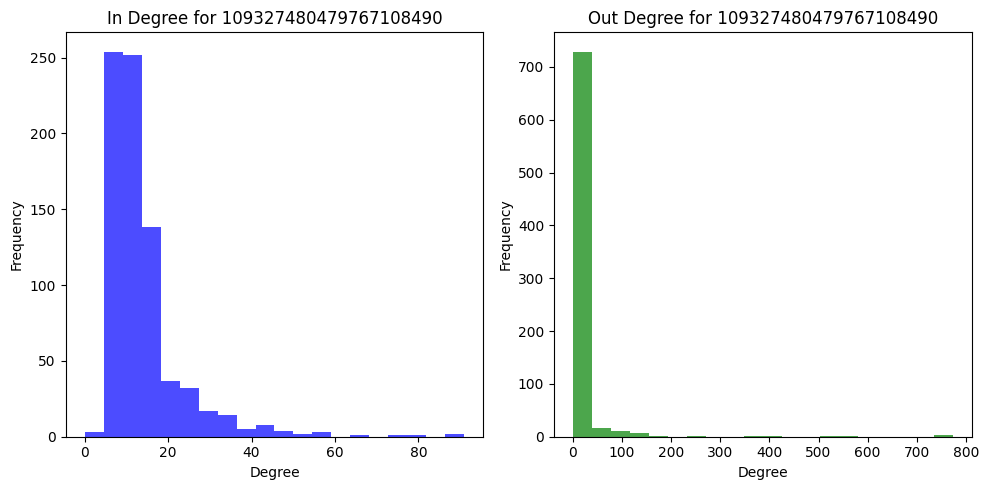

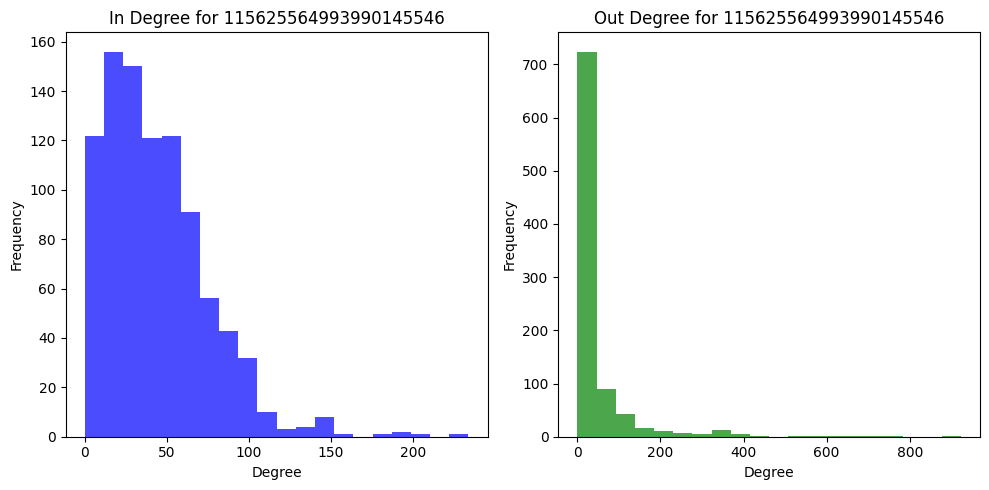

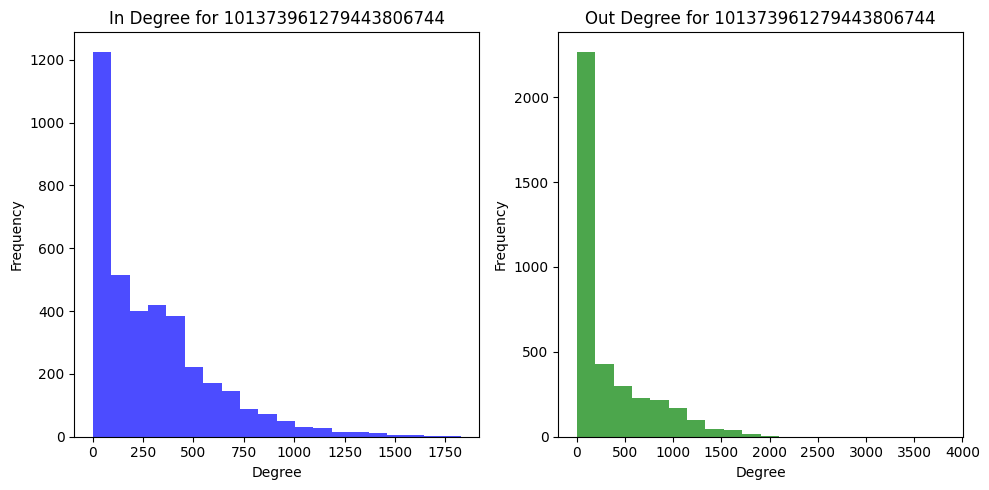

In [ ]:
interest_node = ['109327480479767108490', '115625564993990145546', '101373961279443806744']
graph_inds = []

for node_id in interest_node:
  graph_ind = ego_nodes.index(node_id)
  graph_inds.append(graph_ind)

  tmp_graph = final_graph[graph_ind]

  fig, axs = plt.subplots(1, 2, figsize=(10, 5))

  in_degrees = tmp_graph.degree(mode="in")
  axs[0].hist(in_degrees, bins=20, color='blue', alpha=0.7)
  axs[0].set_title(f"In Degree for {node_id}")
  axs[0].set_xlabel("Degree")
  axs[0].set_ylabel("Frequency")

  out_degrees = tmp_graph.degree(mode="out")
  axs[1].hist(out_degrees, bins=20, color='green', alpha=0.7)
  axs[1].set_title(f"Out Degree for {node_id}")
  axs[1].set_xlabel("Degree")
  axs[1].set_ylabel("Frequency")

  plt.tight_layout()
  plt.show()

**<font color=blue size=4>Question 19**

**QUESTION 19: For the 3 personal networks (node ID given below), plot the in-degree and outdegree distribution of these personal networks. Do the personal networks have a similar in and out degree distribution? In this question, you should have 6 plots.**

**• 109327480479767108490**

**• 115625564993990145546**

**• 101373961279443806744**

For the 3 personal networks (node ID given below), we plot the in-degree and outdegree distribution of these personal networks. You can see the results above. There are 6 plots in total. We can find that for in degree distributions, all three in-degree distributions appear to be right-skewed, as is common for social networks. This skewness implies that the majority of users have a modest number of inbound connections, whilst a minority have a large number. And for out degree distributions, the out degree distributions also show a right-skewed pattern. For each personal network, the in degree distribution is more evenly distributed than the out degree distribution. Also, we can find that even though the personal networks have a similar in and out degree distribution, there are differences in the spread and the range of the degrees. We can find that the third network have the highest in degree and out degree values, and the first network have the lowest in degree and out degree values. Which suggest that the third network is most complex and the first network is simplest.

## (1) Community structure of personal networks

### Question 20

Node ID: 109327480479767108490
Modularity Score for 109327480479767108490: 0.2753
Community Structure for 109327480479767108490:


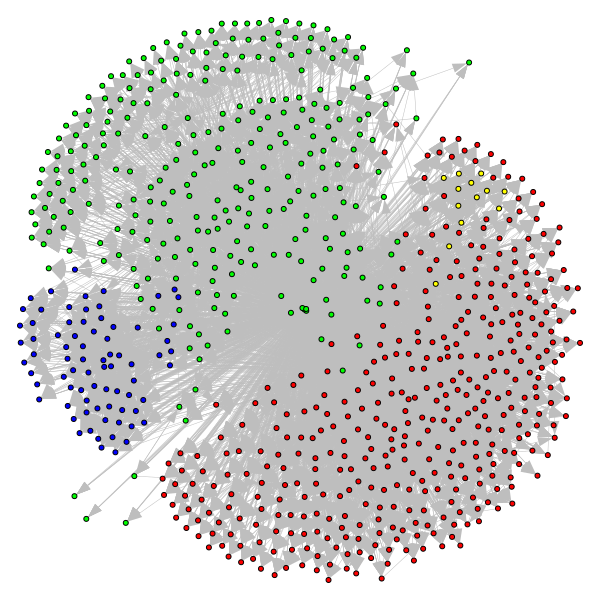

Node ID: 115625564993990145546
Modularity Score for 115625564993990145546: 0.3200
Community Structure for 115625564993990145546:


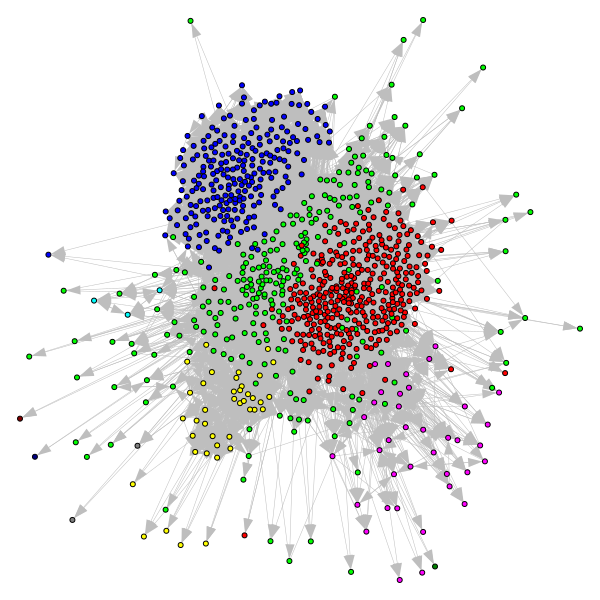

Node ID: 101373961279443806744
Modularity Score for 101373961279443806744: 0.1920
Community Structure for 101373961279443806744:


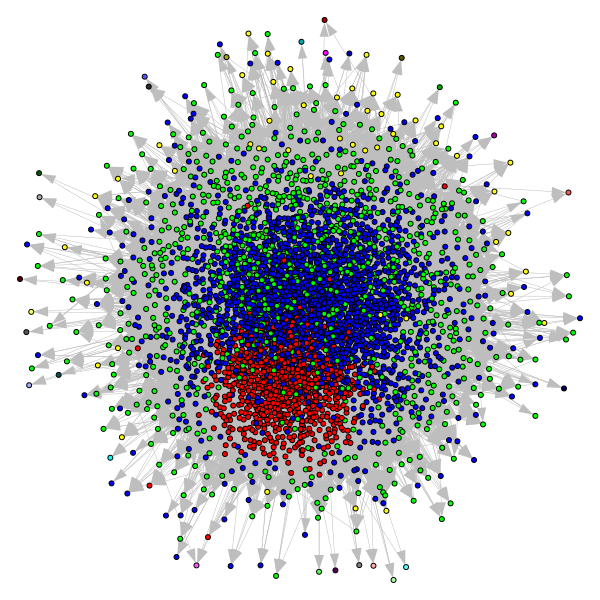

In [ ]:
interest_node = ['109327480479767108490', '115625564993990145546', '101373961279443806744']
graph_inds = []

for node_id in interest_node:
  graph_ind = ego_nodes.index(node_id)
  graph_inds.append(graph_ind)
  print(f"Node ID: {node_id}")

  tmp_graph = final_graph[graph_ind]

  communities = tmp_graph.community_walktrap().as_clustering()

  modularity = communities.modularity
  print(f"Modularity Score for {node_id}: {modularity:.4f}")
  print(f"Community Structure for {node_id}:")

  community_sizes = communities.sizes()
  colors = ig.drawing.colors.ClusterColoringPalette(len(communities))
  tmp_graph.vs['color'] = colors.get_many(communities.membership)
  visual_style = {
    "bbox": (600, 600),
    "margin": 20,
    "vertex_size": 5,
    "edge_width": 0.5,
    "edge_color": 'gray',
    "vertex_color": tmp_graph.vs['color']
  }
  plot_path = f"/content/graph_plot_fg.png"
  ig.plot(tmp_graph, plot_path, **visual_style)
  display(Image(filename=plot_path))
  os.remove(plot_path)

**<font color=blue size=4>Question 20**

**For the 3 personal networks picked in Question 19, extract the community structure of each personal network using Walktrap community detection algorithm. Report the modularity scores and plot the communities using colors. Are the modularity scores similar? In this question, you should have 3 plots.**

For the 3 personal networks picked in Question 19, we extract the community structure of each personal network using Walktrap community detection algorithm. Then we report the modularity scores and plot the communities using colors. You can see the results and plots above. There are 3 plots in total. The modularity score for 109327480479767108490 is 0.2753. The modularity score for 115625564993990145546 is 0.3200. The modularity score for 101373961279443806744 is 0.1920. We can find that the modularity score for the second one is highest, which suggest that this network has the most clearly defined community structure among the three networks. The modularity score for the third one is lowest, indicating that the community structure in this network is less pronounced. As mentioned in question 19, the third network is the most complex among these three networks. And the modularity score for the first one is close to the second one, which suggest that a reasonably distinct community structure. Therefore, the modularity scores are not very similar as shown above, indicating that community structures vary among these three different personal networks. Each network has a varied level of separation between its communities, and the intensity of these divisions varies significantly.


### Question 21

**<font color=blue size=4>Question 21**

**Based on the expression for h and c, explain the meaning of homogeneity and completeness in words.**

We are given the expression for h and c. For the homogeneity, homogeneity is a metric that determines if each community in the network comprises only members from a single circle. If homogeneity is 1, it indicates that the community structure precisely maps onto the circle structure, with no mixing from other circles inside each community. And a homogeneity score close to 1 implies that the communities are pure, and the algorithm performed a good job at assigning nodes to communities based on their real circles. For completeness, completeness determines whether all members of a single circle are assigned to the same community. If completeness is 1, it signifies that all members of a circle are assigned to the same community, regardless of whether those individuals also come from other circles. And a completeness score close to 1 implies that the circles are perfectly preserved within the communities, even if the communities include nodes that are not in the circle.

### Question 22

In [ ]:
def total_people_with_circle_info(circles):
  all_circle_users = set(user for circle in circles for user in circle)
  return len(all_circle_users)

def count_in_community_with_circles(communities, circles, community_index):
    all_circle_users = set(user for circle in circles for user in circle)

    community_members = [idx for idx, comm in enumerate(communities.membership) if comm == community_index]

    count = sum(1 for idx in community_members if communities.graph.vs[idx]["name"] in all_circle_users)
    return count

def compute_H_C(circles):
  H_C = 0
  N = total_people_with_circle_info(circles)
  for circles in circles:
    H_C += len(circles) / N * np.log(len(circles) / N)
  return -H_C

def compute_H_K(communities, circles):
  H_K = 0
  N = total_people_with_circle_info(circles)
  for community_index in np.unique(communities.membership):
    community_members = [idx for idx, comm in enumerate(communities.membership) if comm == community_index]
    b_i = count_in_community_with_circles(communities, circles, community_index)
    if b_i == 0:
      continue
    H_K += b_i / N * np.log(b_i / N)
  return -H_K

def count_in_community_and_circle(communities, circle, community_index):
  circle_users = set(circle)
  community_members = [idx for idx, comm in enumerate(communities.membership) if comm == community_index]
  count = sum(1 for idx in community_members if communities.graph.vs[idx]["name"] in circle_users)
  return count

def compute_H_C_K(circles, communities):
  N = total_people_with_circle_info(circles)
  H_C_K = 0
  K_ls = np.unique(communities.membership)
  for k in K_ls:
    community_members = [idx for idx, comm in enumerate(communities.membership) if comm == k]
    for c in circles:
      A_j_i = count_in_community_and_circle(communities, c, k)
      b_j = count_in_community_with_circles(communities, circles, k)
      if b_j == 0 or A_j_i == 0:
        continue

      h_c_k = A_j_i / N * np.log(A_j_i / b_j)
      H_C_K += h_c_k
  return -H_C_K

def compute_H_K_C(circles, communities):
  N = total_people_with_circle_info(circles)
  H_K_C = 0
  K_ls = np.unique(communities.membership)
  for c in circles:
    for k in K_ls:
      community_members = [idx for idx, comm in enumerate(communities.membership) if comm == k]
      A_j_i = count_in_community_and_circle(communities, c, k)
      if A_j_i == 0:
        continue
      a_i = len(c)
      H_K_C += A_j_i / N * np.log(A_j_i / a_i)
  return -H_K_C

def compute_homogeneity(circles, communities):
  h = 1 - compute_H_C_K(circles, communities) / compute_H_C(circles)
  return h

def compute_completeness(circles, communities):
  c = 1 - compute_H_K_C(circles, communities) / compute_H_K(communities, circles)
  return c

In [ ]:
for node_i in ['109327480479767108490', '115625564993990145546', '101373961279443806744']:
  index_i = ego_nodes.index(node_i)
  graph_i = final_graph[index_i]
  circle_i = graph_circles[index_i]
  communities_i = graph_i.community_walktrap().as_clustering()
  print(f'For node {node_i}: h = {compute_homogeneity(circle_i, communities_i):.4f}, c = {compute_completeness(circle_i, communities_i):.4f}')

For node 109327480479767108490: h = 0.8519, c = 0.3299
For node 115625564993990145546: h = 0.4519, c = -3.4240
For node 101373961279443806744: h = 0.0039, c = -1.5042


**<font color=blue size=4>Question 22**

**Compute the h and c values for the community structures of the 3 personal network (same nodes as Question 19). Interpret the values and provide a detailed explanation. Are there negative values? Why?**

We compute the h and c values for the community structures of the 3 personal network (same nodes as Question 19). You can see the results above.

* For node 109327480479767108490: h = 0.8519, c = 0.3299. For h = 0.8519, the high number suggests that the communities identified in the personal network are extremely homogeneous. This suggests that the communities are mostly made up of nodes from one circle, with little mixing of nodes from different circles within them. For c = 0.3299, the value is greater than zero but significantly less than one, indicating that, while there is some degree of completeness, not all members of a single circle are always assigned to the same community. There may be some distribution of circle members among several communities.


* For node 115625564993990145546: h = 0.4519, c = -3.4240. For h = 0.4519, the value is lower than that of the first node, indicating that the communities are moderately homogeneous. There is more mixing of nodes from various circles within the same community than with the first node. For c = -3.4240, this is a negative value. The possible reason is that the individuals who belong to many circles (multiclass membership) may complicate circle-to-community mapping. The algorithms used to calculate entropy may fail to account for this overlap, causing entropy calculations to be inaccurate. Also, another reaons is that if the clustering method generates communities that do not closely like the actual circles due to algorithm limits or data quirks, the conditional entropy may be overestimated, resulting in an incorrect, negative completeness score.


* For node 101373961279443806744: h = 0.0039, c = -1.5042. For h = 0.0039, the very low value suggests almost no homogeneity, meaning the communities are not pure and contain nodes from many different circles. For c = -1.5042, this is also a negative value. The possible reasons cause the negative value are mentioned above.




# Part 3: Cora dataset

## Question 23

In [ ]:
# Reference: The official stellargraph tutorial: https://stellargraph.readthedocs.io/en/stable/demos/node-classification/gcn-node-classification.html
import pandas as pd
import os

import stellargraph as sg
from stellargraph.mapper import FullBatchNodeGenerator
from stellargraph.layer import GCN

from tensorflow.keras import layers, optimizers, losses, metrics, Model
from sklearn import preprocessing, model_selection
from IPython.display import display, HTML
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
# get the data from cora
dataset = sg.datasets.Cora()
display(HTML(dataset.description))
G, node_subjects = dataset.load()
print(G.info())
node_subjects.value_counts().to_frame()

StellarGraph: Undirected multigraph
 Nodes: 2708, Edges: 5429

 Node types:
  paper: [2708]
    Features: float32 vector, length 1433
    Edge types: paper-cites->paper

 Edge types:
    paper-cites->paper: [5429]
        Weights: all 1 (default)
        Features: none


,subject
Neural_Networks,818
Probabilistic_Methods,426
Genetic_Algorithms,418
Theory,351
Case_Based,298
Reinforcement_Learning,217
Rule_Learning,180


In [ ]:
#get 20 train instances per class
#remaining instances are in test set test

# do a for loop to get 20 instances per class and make new dataframes
train_data = pd.DataFrame()
test_data = pd.DataFrame()

for i in node_subjects.unique():
    temp = node_subjects[node_subjects == i]
    temp = temp.sample(n=20)
    train_data = pd.concat([train_data, temp])
    temp = node_subjects.drop(temp.index)
    test_data = pd.concat([test_data, temp])

# still keep the same name for the columns
train_data.columns = ['subject']
test_data.columns = ['subject']

train_subjects = train_data['subject']
val_subjects, test_subjects = model_selection.train_test_split(
    test_data['subject'], train_size=0.5, stratify=test_data['subject']
)

# shuffle the train subjects
train_subjects = train_subjects.sample(frac=1, random_state=42)
train_subjects.value_counts().to_frame()

,subject
Genetic_Algorithms,20
Probabilistic_Methods,20
Rule_Learning,20
Reinforcement_Learning,20
Neural_Networks,20
Theory,20
Case_Based,20


In [ ]:
target_encoding = preprocessing.LabelBinarizer()

train_targets = target_encoding.fit_transform(train_subjects)
val_targets = target_encoding.transform(val_subjects)
test_targets = target_encoding.transform(test_subjects)
generator = FullBatchNodeGenerator(G, method="gcn")

train_gen = generator.flow(train_subjects.index, train_targets)

gcn = GCN(
    layer_sizes=[16, 16], activations=["relu", "relu"], generator=generator, dropout=0.5
)

x_inp, x_out = gcn.in_out_tensors()

predictions = layers.Dense(units=train_targets.shape[1], activation="softmax")(x_out)

model = Model(inputs=x_inp, outputs=predictions)
model.compile(
    optimizer=optimizers.Adam(learning_rate=0.001),
    loss=losses.categorical_crossentropy,
    metrics=["acc"],
)

Using GCN (local pooling) filters...


In [ ]:
val_gen = generator.flow(val_subjects.index, val_targets)
from tensorflow.keras.callbacks import EarlyStopping
es_callback = EarlyStopping(monitor="val_acc", patience=50, restore_best_weights=True)

# start training
history = model.fit(
    train_gen,
    epochs=100,
    validation_data=val_gen,
    verbose=2,
    shuffle=False,  # this should be False, since shuffling data means shuffling the whole graph
    callbacks=[es_callback],
)

Epoch 1/100
1/1 - 0s - loss: 1.5424 - acc: 0.7071 - val_loss: 1.6095 - val_acc: 0.7186 - 314ms/epoch - 314ms/step
Epoch 2/100
1/1 - 0s - loss: 1.5173 - acc: 0.6857 - val_loss: 1.5993 - val_acc: 0.7214 - 261ms/epoch - 261ms/step
Epoch 3/100
1/1 - 0s - loss: 1.5473 - acc: 0.7143 - val_loss: 1.5892 - val_acc: 0.7251 - 237ms/epoch - 237ms/step
Epoch 4/100
1/1 - 0s - loss: 1.5139 - acc: 0.6714 - val_loss: 1.5790 - val_acc: 0.7276 - 220ms/epoch - 220ms/step
Epoch 5/100
1/1 - 0s - loss: 1.5047 - acc: 0.7357 - val_loss: 1.5686 - val_acc: 0.7325 - 240ms/epoch - 240ms/step
Epoch 6/100
1/1 - 0s - loss: 1.4949 - acc: 0.7786 - val_loss: 1.5581 - val_acc: 0.7389 - 197ms/epoch - 197ms/step
Epoch 7/100
1/1 - 0s - loss: 1.4541 - acc: 0.7643 - val_loss: 1.5473 - val_acc: 0.7418 - 177ms/epoch - 177ms/step
Epoch 8/100
1/1 - 0s - loss: 1.4797 - acc: 0.7214 - val_loss: 1.5365 - val_acc: 0.7433 - 181ms/epoch - 181ms/step
Epoch 9/100
1/1 - 0s - loss: 1.4684 - acc: 0.7714 - val_loss: 1.5257 - val_acc: 0.7472 -

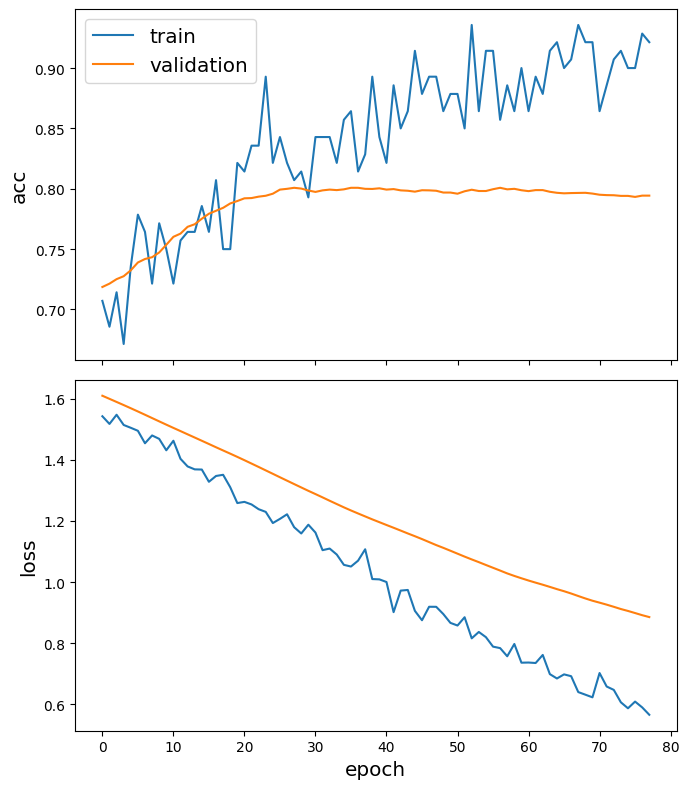

In [ ]:
sg.utils.plot_history(history)

In [ ]:
test_gen = generator.flow(test_subjects.index, test_targets)
test_metrics = model.evaluate(test_gen)
print("\nTest Set Metrics:")
for name, val in zip(model.metrics_names, test_metrics):
    print("\t{}: {:0.4f}".format(name, val))

# make predictions with the model
all_nodes = node_subjects.index
all_gen = generator.flow(all_nodes)
all_predictions = model.predict(all_gen)

1/1 [==============================] - 0s 104ms/step - loss: 1.3277 - acc: 0.7913

Test Set Metrics:
	loss: 1.3277
	acc: 0.7913
1/1 [==============================] - 0s 298ms/step


1/1 [==============================] - 0s 198ms/step


c:\Users\cheng\anaconda3\envs\232\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
c:\Users\cheng\anaconda3\envs\232\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[None,
 Text(0.5, 0, '$X_1$'),
 Text(0, 0.5, '$X_2$'),
 Text(0.5, 1.0, 'TSNE visualization of GCN embeddings for cora dataset')]

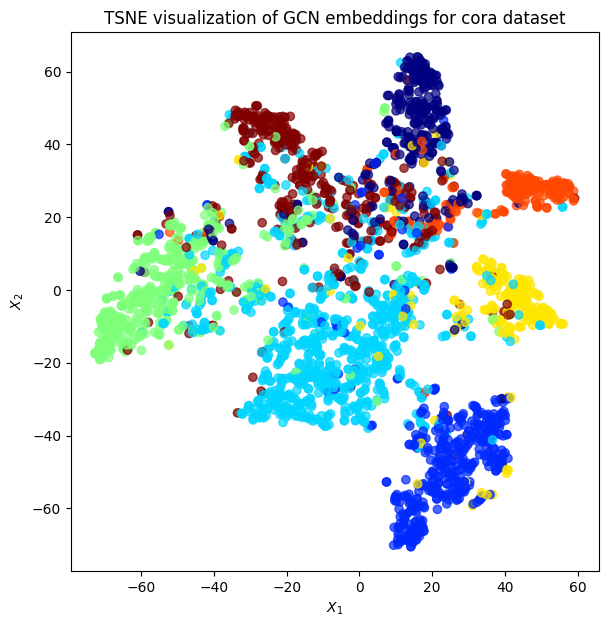

In [ ]:
# Evaluate the model
node_predictions = target_encoding.inverse_transform(all_predictions.squeeze())
embedding_model = Model(inputs=x_inp, outputs=x_out)
emb = embedding_model.predict(all_gen)
X = emb.squeeze(0)
from sklearn.manifold import TSNE

transform = TSNE
trans = transform(n_components=2)
X_reduced = trans.fit_transform(X)
fig, ax = plt.subplots(figsize=(7, 7))
ax.scatter(
    X_reduced[:, 0],
    X_reduced[:, 1],
    c=node_subjects.astype("category").cat.codes,
    cmap="jet",
    alpha=0.7,
)
ax.set(
    aspect="equal",
    xlabel="$X_1$",
    ylabel="$X_2$",
    title=f"{transform.__name__} visualization of GCN embeddings for cora dataset",
)

**<font color=blue size=4>Question 23**

**Idea 1**

We have used the stellar graph's gcn to implement a graph neural network for the task of node classification. The dataset used is the Cora dataset. The Cora dataset consists of 2708 scientific publications classified into one of seven classes. The citation network consists of 5429 links.

WE follow the architecture of the GCN model as described in the paper Semi-Supervised Classification with Graph Convolutional Networks by Thomas N. Kipf and Max Welling. The model consists of two layers of Graph Convolutional Networks followed by a softmax layer. The model is trained using the cross-entropy loss function.

We follow the instruction to only add 20 instance for each class in training data and the rest in test and validation data. This will ensure the balance of the dataset.

For the hyperparameters, we use the following:
- learning rate = 0.001
- epochs = 100
- dropout = 0.5

We used one GCN layer with the layer size of 16. The model is trained using the Adam optimizer.

For the result, we have the following:
- From the below graph, we can see the training loss is decreasing over time. The train accuracy increases over time. And the validation curve is normal with the train curve.

- We also plot a TSNE graph to visualize the node embeddings. We can see that the nodes are well separated in the 2D space, and is clustered by their classes.

## Question 24

In [ ]:
# install StellarGraph if running on Google Colab
import sys
if 'google.colab' in sys.modules:
  %pip install -q stellargraph[demos]==1.2.1 --ignore-requires-python

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 435.2/435.2 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 531.9/531.9 kB 25.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.4/123.4 kB 17.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.5/93.5 kB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 60.9 MB/s eta 0:00:00


In [ ]:
import matplotlib.pyplot as plt

from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegressionCV
from sklearn.metrics import accuracy_score

import os
import networkx as nx
import numpy as np
import pandas as pd

from stellargraph.data import BiasedRandomWalk
from stellargraph import StellarGraph #feel free to use any other library of your choice
from stellargraph import datasets
from IPython.display import display, HTML

%matplotlib inline

In [ ]:
dataset = datasets.Cora()
display(HTML(dataset.description))
G, node_subjects = dataset.load(largest_connected_component_only=True)
print(G.info())


StellarGraph: Undirected multigraph
 Nodes: 2485, Edges: 5209

 Node types:
  paper: [2485]
    Features: float32 vector, length 1433
    Edge types: paper-cites->paper

 Edge types:
    paper-cites->paper: [5209]
        Weights: all 1 (default)
        Features: none


node2vec:

In [ ]:
# walks = get random walks using BiasedRandomWalk
walks = BiasedRandomWalk(G)

#experiment with the hyperparamenters
experiment = walks.run(
    nodes=list(G.nodes()),
    length=100,
    n=10,
    p=0.5,
    q=2.0,
    weighted=True,
    seed=42
)
print("Number of random walks: {}".format(len(experiment)))

Number of random walks: 24850


In [ ]:
from gensim.models import Word2Vec

str_walks = [[str(n) for n in walk] for walk in experiment]
model = Word2Vec(str_walks,  window=5, sg=1, hs=1, negative=0, seed=42)

In [ ]:
# The embedding vectors can be retrieved from model.wv using the node ID as key.
model.wv["19231"].shape

(100,)

visualize

In [ ]:
# Retrieve node embeddings and corresponding subjects
node_ids = model.wv.index_to_key  # list of node IDs
node_embeddings = (
    model.wv.vectors
)  # numpy.ndarray of size number of nodes times embeddings dimensionality
node_targets = node_subjects[[int(node_id) for node_id in node_ids]]

In [ ]:
# Apply t-SNE transformation on node embeddings
tsne = TSNE(n_components=2)
node_embeddings_2d = tsne.fit_transform(node_embeddings)

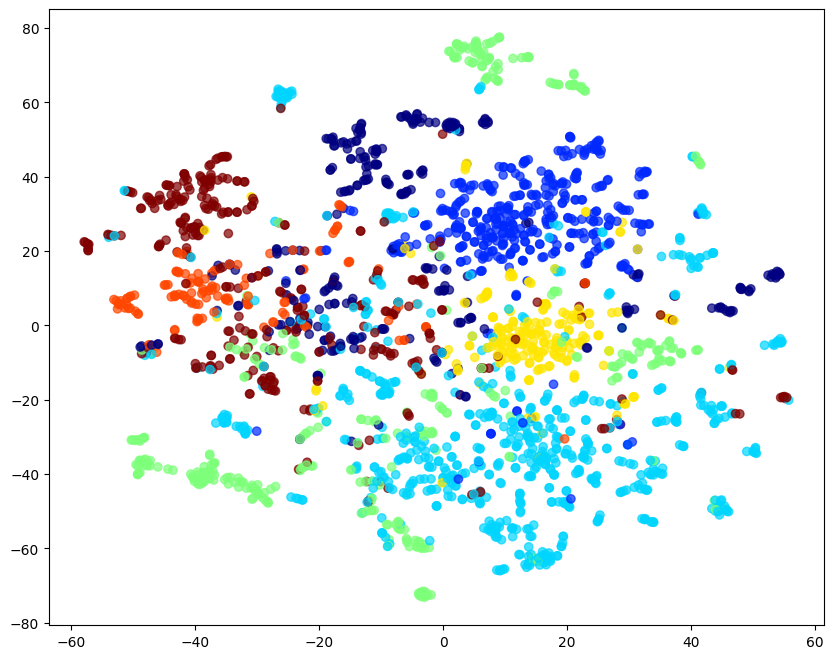

In [ ]:
# draw the points
alpha = 0.7
label_map = {l: i for i, l in enumerate(np.unique(node_targets))}
node_colours = [label_map[target] for target in node_targets]

plt.figure(figsize=(10, 8))
plt.scatter(
    node_embeddings_2d[:, 0],
    node_embeddings_2d[:, 1],
    c=node_colours,
    cmap="jet",
    alpha=alpha,
)

CORA classification

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.multiclass import OneVsOneClassifier
from sklearn.svm import SVC
from sklearn.metrics import f1_score, recall_score, accuracy_score, precision_score

# Load the 128-dimensional input features and corresponding target values
node_embeddings = node_embeddings_2d
node_targets = np.array(node_targets)
print(node_embeddings, node_targets)

# Encode target labels as integers
unique_targets = np.unique(node_targets)
encoded_targets = np.searchsorted(unique_targets, node_targets)
print(unique_targets)

# Split data into training and test sets
train_size_ratio = 0.05
X_train, X_test, y_train, y_test = train_test_split(
    node_embeddings, encoded_targets, train_size=train_size_ratio, random_state=42
)
print(f"Array shapes:\n X_train = {X_train.shape}\n y_train = {y_train.shape}\n X_test = {X_test.shape}\n y_test = {y_test.shape}")

# Setup and train a One-vs-One SVM classifier
svm_ovo_classifier = OneVsOneClassifier(SVC(random_state=42))
param_grid = {
    'estimator__kernel': ['linear'],
    'estimator__C': [0.01, 0.1, 1, 10, 100]
}
grid_search = GridSearchCV(svm_ovo_classifier, param_grid, cv=5, scoring='accuracy', verbose=10)
grid_search.fit(X_train, y_train)

# Predict using the best estimator from grid search
predictions = grid_search.best_estimator_.predict(X_test)

# Calculate performance metrics
f1_score_macro = f1_score(y_test, predictions, average='macro')
recall_macro = recall_score(y_test, predictions, average='macro')
accuracy_score_value = accuracy_score(y_test, predictions)
precision_macro = precision_score(y_test, predictions, average='macro')

print(f"F1 Score: {f1_score_macro}")
print(f"Recall: {recall_macro}")
print(f"Accuracy: {accuracy_score_value}")
print(f"Precision: {precision_macro}")

[[ 10.721826   24.97021  ]
 [ 10.58919    -4.3351483]
 [ 15.80598   -35.195827 ]
 ...
 [  6.0498776  26.492702 ]
 [-35.261715  -24.00221  ]
 [ 10.595192   32.21463  ]] ['Genetic_Algorithms' 'Reinforcement_Learning' 'Neural_Networks' ...
 'Genetic_Algorithms' 'Neural_Networks' 'Genetic_Algorithms']
['Case_Based' 'Genetic_Algorithms' 'Neural_Networks'
 'Probabilistic_Methods' 'Reinforcement_Learning' 'Rule_Learning' 'Theory']
Array shapes:
 X_train = (124, 2)
 y_train = (124,)
 X_test = (2361, 2)
 y_test = (2361,)
Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV 1/5; 1/5] START estimator__C=0.01, estimator__kernel=linear.................
[CV 1/5; 1/5] END estimator__C=0.01, estimator__kernel=linear;, score=0.440 total time=   0.0s
[CV 2/5; 1/5] START estimator__C=0.01, estimator__kernel=linear.................
[CV 2/5; 1/5] END estimator__C=0.01, estimator__kernel=linear;, score=0.400 total time=   0.0s
[CV 3/5; 1/5] START estimator__C=0.01, estimator__kernel=linear.......

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.utils import shuffle
from google.colab import drive
drive.mount('/content/gdrive')
%cd /content/gdrive/MyDrive/data/

all_data = []
all_edges = []

for root,dirs,files in os.walk('./cora'):
    for file in files:
        if '.content' in file:
            with open(os.path.join(root,file),'r') as f:
                all_data.extend(f.read().splitlines())
        elif 'cites' in file:
            with open(os.path.join(root,file),'r') as f:
                all_edges.extend(f.read().splitlines())

all_data = shuffle(all_data,random_state=42)

labels = []
nodes = []
X = []

for i,data in enumerate(all_data):
    elements = data.split('\t')
    labels.append(elements[-1])
    X.append(elements[1:-1])
    nodes.append(elements[0])

X = np.array(X,dtype=int)
N = X.shape[0]
F = X.shape[1]
print('X shape: ', X.shape)


#parse the edge
edge_list=[]
for edge in all_edges:
    e = edge.split('\t')
    edge_list.append((e[0],e[1]))

print('\nNumber of nodes (N): ', N)
print('\nNumber of features (F) of each node: ', F)
print('\nCategories: ', set(labels))

num_classes = len(set(labels))
print('\nNumber of classes: ', num_classes)
print('\nNumber of edges: ', len(edge_list))

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
/content/gdrive/MyDrive/data
X shape:  (2708, 1433)

Number of nodes (N):  2708

Number of features (F) of each node:  1433

Categories:  {'Theory', 'Probabilistic_Methods', 'Reinforcement_Learning', 'Genetic_Algorithms', 'Neural_Networks', 'Case_Based', 'Rule_Learning'}

Number of classes:  7

Number of edges:  5429


In [ ]:
# Get the text feature with tf-idf
from sklearn.feature_extraction.text import TfidfTransformer

tfidf_transformer = TfidfTransformer()
X_tfidf = tfidf_transformer.fit_transform(X)
labels = np.array(labels)

# Train test spilit
from sklearn.model_selection import train_test_split
X_train_tfidf, X_test_tfidf, y_train_tfidf, y_test_tfidf = train_test_split(X_tfidf, labels, test_size=0.05, random_state=42)

print(f"Array shapes:\n X_train_tfidf = {X_train_tfidf.shape}\n y_train_tfidf = {y_train_tfidf.shape}\n X_test_tfidf = {X_test_tfidf.shape}\n y_test_tfidf = {y_test_tfidf.shape}")

# Setup and train a One-vs-One SVM classifier
svm_ovo_classifier = OneVsOneClassifier(SVC(random_state=42))
param_grid = {
    'estimator__kernel': ['linear'],
    'estimator__C': [0.01, 0.1, 1, 10, 100]
}
grid_search = GridSearchCV(svm_ovo_classifier, param_grid, cv=5, scoring='accuracy', verbose=10)
grid_search.fit(X_train_tfidf, y_train_tfidf)

# Predict using the best estimator from grid search
predictions = grid_search.best_estimator_.predict(X_test_tfidf)

# Calculate performance metrics
f1_score_macro = f1_score(y_test_tfidf, predictions, average='macro')
recall_macro = recall_score(y_test_tfidf, predictions, average='macro')
accuracy_score_value = accuracy_score(y_test_tfidf, predictions)
precision_macro = precision_score(y_test_tfidf, predictions, average='macro')

print(f"F1 Score: {f1_score_macro}")
print(f"Recall: {recall_macro}")
print(f"Accuracy: {accuracy_score_value}")
print(f"Precision: {precision_macro}")

Array shapes:
 X_train_tfidf = (2572, 1433)
 y_train_tfidf = (2572,)
 X_test_tfidf = (136, 1433)
 y_test_tfidf = (136,)
Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV 1/5; 1/5] START estimator__C=0.01, estimator__kernel=linear.................
[CV 1/5; 1/5] END estimator__C=0.01, estimator__kernel=linear;, score=0.297 total time=   2.9s
[CV 2/5; 1/5] START estimator__C=0.01, estimator__kernel=linear.................
[CV 2/5; 1/5] END estimator__C=0.01, estimator__kernel=linear;, score=0.299 total time=   2.9s
[CV 3/5; 1/5] START estimator__C=0.01, estimator__kernel=linear.................
[CV 3/5; 1/5] END estimator__C=0.01, estimator__kernel=linear;, score=0.300 total time=   2.8s
[CV 4/5; 1/5] START estimator__C=0.01, estimator__kernel=linear.................
[CV 4/5; 1/5] END estimator__C=0.01, estimator__kernel=linear;, score=0.300 total time=   2.8s
[CV 5/5; 1/5] START estimator__C=0.01, estimator__kernel=linear.................
[CV 5/5; 1/5] END estimator__C=0.01

In [ ]:
# Combine the two kinds of features
# Combine the two kinds of features
X_combined = np.hstack((X, X_tfidf.toarray()))
X_train_combined, X_test_combined, y_train_combined, y_test_combined = train_test_split(X_combined, labels, test_size=0.05, random_state=42)

print(f"Array shapes:\n X_train_combined = {X_train_combined.shape}\n y_train_combined = {y_train_combined.shape}\n X_test_combined = {X_test_combined.shape}\n y_test_combined = {y_test_combined.shape}")

# Setup and train a One-vs-One SVM classifier
svm_ovo_classifier = OneVsOneClassifier(SVC(random_state=42))

param_grid = {
    'estimator__kernel': ['linear'],
    'estimator__C': [0.01, 0.1, 1, 10, 100]
}
grid_search = GridSearchCV(svm_ovo_classifier, param_grid, cv=5, scoring='accuracy', verbose=10)
grid_search.fit(X_train_combined, y_train_combined)

# Predict using the best estimator from grid search
predictions = grid_search.best_estimator_.predict(X_test_combined)

# Calculate performance metrics
f1_score_macro = f1_score(y_test_combined, predictions, average='macro')
recall_macro = recall_score(y_test_combined, predictions, average='macro')
accuracy_score_value = accuracy_score(y_test_combined, predictions)
precision_macro = precision_score(y_test_combined, predictions, average='macro')

print(f"F1 Score: {f1_score_macro}")
print(f"Recall: {recall_macro}")
print(f"Accuracy: {accuracy_score_value}")
print(f"Precision: {precision_macro}")

Array shapes:
 X_train_combined = (2572, 2866)
 y_train_combined = (2572,)
 X_test_combined = (136, 2866)
 y_test_combined = (136,)
Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV 1/5; 1/5] START estimator__C=0.01, estimator__kernel=linear.................
[CV 1/5; 1/5] END estimator__C=0.01, estimator__kernel=linear;, score=0.621 total time=  14.5s
[CV 2/5; 1/5] START estimator__C=0.01, estimator__kernel=linear.................
[CV 2/5; 1/5] END estimator__C=0.01, estimator__kernel=linear;, score=0.656 total time=  14.4s
[CV 3/5; 1/5] START estimator__C=0.01, estimator__kernel=linear.................
[CV 3/5; 1/5] END estimator__C=0.01, estimator__kernel=linear;, score=0.656 total time=  14.5s
[CV 4/5; 1/5] START estimator__C=0.01, estimator__kernel=linear.................
[CV 4/5; 1/5] END estimator__C=0.01, estimator__kernel=linear;, score=0.623 total time=  14.4s
[CV 5/5; 1/5] START estimator__C=0.01, estimator__kernel=linear.................
[CV 5/5; 1/5] END estim

**<font color=blue size=4>Question 24**

**Idea 2**

We extract the node feature by using the node2vec algorithm, and then use the extracted features to train a SVM model. Node2Vec is an algorithm that learns continuous feature representations for nodes in networks. We use the node2vec implementation from the `gensim` library. It used the second-order random walk to generate the node sequences, and then used the Word2Vec algorithm to learn the node features.

We also extract the text feature by using the TF-IDF algorithm, and then use the extracted features to train a SVM model. TF-IDF is a numerical statistic that is intended to reflect how important a word is to a document in a collection or corpus. We use the TfidfTransformer implementation from the `sklearn` library.

Finally, we concatenate the node features and text features, and use the concatenated features to train a SVM model.

The result is as follows (the accuracy score):
- node2vec: 0.47
- TF-IDF: 0.85
- node2vec + TF-IDF: 0.79

The result shows that the text feature is more important than the node feature. The cora dataset is a citation network, and the text feature is described as the content of the paper. For the classification task, the content of the paper is more important than the citation network structure. Although the network structure shows the relationship between papers, the content of the paper is more informative for the classification task.

## Question 25

In [ ]:
import numpy as np
import os
import networkx as nx
from sklearn.model_selection import train_test_split
import pandas as pd
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from numpy import dot
from numpy.linalg import norm


from collections import Counter
import matplotlib.pyplot as plt


In [ ]:
all_data = []
all_edges = []

for root,dirs,files in os.walk('./cora'):
    for file in files:
        if '.content' in file:
            with open(os.path.join(root,file),'r') as f:
                all_data.extend(f.read().splitlines())
        elif 'cites' in file:
            with open(os.path.join(root,file),'r') as f:
                all_edges.extend(f.read().splitlines())


#random_state = 42
#all_data = shuffle(all_data,random_state=random_state)

In [ ]:
categories =  ['Reinforcement_Learning', 'Theory', 'Case_Based', 'Genetic_Algorithms', 'Probabilistic_Methods', 'Neural_Networks', 'Rule_Learning']
sorted(categories)
label_encoder = {}
i = 0
for cat in sorted(categories):
  label_encoder[cat] = i
  i +=1
label_encoder


{'Case_Based': 0,
 'Genetic_Algorithms': 1,
 'Neural_Networks': 2,
 'Probabilistic_Methods': 3,
 'Reinforcement_Learning': 4,
 'Rule_Learning': 5,
 'Theory': 6}

In [ ]:
#parse the data
labels = []
nodes = []
X = []
element_to_ind  = {}

for i,data in enumerate(all_data):
    elements = data.split('\t')
    labels.append(label_encoder[elements[-1]])
    X.append(elements[1:-1])
    nodes.append(elements[0])
    element_to_ind[elements[0]]= i
X = np.array(X,dtype=int)
N = X.shape[0] #the number of nodes
F = X.shape[1] #the size of node features
print('X shape: ', X.shape)


#parse the edge
edge_list=[]
for edge in all_edges:
    e = edge.split('\t')
    edge_list.append((e[0],e[1]))

print('\nNumber of nodes (N): ', N)
print('\nNumber of features (F) of each node: ', F)
print('\nCategories: ', set(labels))

num_classes = len(set(labels))
print('\nNumber of classes: ', num_classes)


X shape:  (2708, 1433)

Number of nodes (N):  2708

Number of features (F) of each node:  1433

Categories:  {0, 1, 2, 3, 4, 5, 6}

Number of classes:  7


In [ ]:
G = nx.Graph()
G.add_nodes_from(nodes)
G.add_edges_from(edge_list)
G = nx.relabel_nodes(G, element_to_ind)
print('Graph info: ', nx.info(G))

Graph info:  Graph with 2708 nodes and 5278 edges


In [ ]:
nodes = list(G.nodes)
print(len(nodes))
list(G.neighbors(0))

2708


[258, 544, 8, 435, 14]

In [ ]:
df = pd.DataFrame(list(zip(nodes, labels,X)),columns =['node', 'label','features'])
print(len(df))
df.head()

2708


,node,label,features
0,0,2,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
1,1,5,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, ..."
2,2,4,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,3,4,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,4,3,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [ ]:
Gcc = sorted(nx.connected_components(G), key=len, reverse=True)
G = G.subgraph(Gcc[0])
gcc_nodes = list(G.nodes)

In [ ]:
df = df.loc[df['node'].isin(gcc_nodes)]
df['node'] = list(range(len(df))) #rename nodes
df.head()

,node,label,features
0,0,2,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
1,1,5,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, ..."
2,2,4,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,3,4,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,4,3,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [ ]:
train = df.groupby('label', group_keys=False).apply(lambda x: x.sample(20))
G = nx.relabel_nodes(G, df['node'])

In [ ]:
def create_transition_matrix(g):
    vs = list(g.nodes)
    n = len(vs)
    adj = nx.adjacency_matrix(g)
    transition_matrix = adj/adj.sum(axis=1)

    return transition_matrix

In [ ]:
def random_walk(g, num_steps, start_node, transition_matrix = None):
    if transition_matrix is None:
        transition_matrix = create_transition_matrix(g)
    v = start_node
    n = range(transition_matrix.shape[0])
    for _ in range(num_steps):
        p = transition_matrix[v,]
        v = np.random.choice(n, p = np.ravel(p, order = 'C'))
    return v

In [ ]:
seeds_dict = {predicted:list(train[train['label'] == predicted]['node']) for predicted in range(7)}

def random_walk_with_teleportation(g, num_steps, start_node,tp,predicted, transition_matrix = None):
    if transition_matrix is None:
        transition_matrix = create_transition_matrix(g)
    v = start_node
    n = range(transition_matrix.shape[0])
    s = seeds_dict[predicted]
    for _ in range(num_steps):
        run = np.random.uniform(low=0.0, high=1.0, size=None)
        if run < tp:
            v = np.random.choice(s)
        else:
            p = transition_matrix[v,]
            v = np.random.choice(n, p = np.ravel(p, order='C'))
    return v


In [ ]:
#pagerank. NO teleportation, NO tfidf.
from tqdm import tqdm
transition_matrix = create_transition_matrix(G)

num_samples = 1000
num_walk_steps = 100

visiting_freq_label = []
for i in range(transition_matrix.shape[0]):
  visiting_freq_label.append([0,0,0,0,0,0,0])

visiting_freq = [0 for i in range(transition_matrix.shape[0])]


for train_node, predicted in tqdm(zip(train['node'], train['label']), total=len(train)):
  #print (train_node,predicted)
  for i in range(num_samples):
      start_point = train_node
      end_node = random_walk(G, num_walk_steps, start_point, transition_matrix)
      visiting_freq_label[end_node][predicted] += 1
      visiting_freq[end_node] +=1

count = 0 #these many nodes remain unvisited.
for vf in visiting_freq:
  if vf ==0:
    count+=1
print('unvisited = ', count)
visiting_freq_label = np.asarray(visiting_freq_label)
preds = np.argmax(visiting_freq_label,axis = 1)
print(classification_report(df['label'], preds))
accuracy_score(df['label'], preds)

  0%|          | 0/140 [00:00<?, ?it/s]

100%|██████████| 140/140 [1:00:53<00:00, 26.09s/it]

unvisited =  0
              precision    recall  f1-score   support

           0       0.32      0.53      0.40       285
           1       0.49      0.55      0.52       406
           2       0.57      0.28      0.37       726
           3       0.56      0.52      0.54       379
           4       0.10      0.14      0.12       214
           5       0.08      0.15      0.10       131
           6       0.29      0.25      0.27       344

    accuracy                           0.37      2485
   macro avg       0.34      0.35      0.33      2485
weighted avg       0.42      0.37      0.37      2485



0.36579476861167004

In [ ]:
#pagerank. WITH telportation, without tfidf

#repeat above expeiment but this time use the teleportation random walk

#get metrics
from sklearn.metrics import classification_report

num_samples = 1000
num_walk_steps = 100
teleportation_probability = 0.1

visiting_freq_label = []
for i in range(transition_matrix.shape[0]):
  visiting_freq_label.append([0,0,0,0,0,0,0])

visiting_freq = [0 for i in range(transition_matrix.shape[0])]

for train_node, predicted in tqdm(zip(train['node'], train['label']), total=len(train)):
  for i in range(num_samples):
      start_point = train_node
      end_node = random_walk_with_teleportation(G, num_walk_steps, start_point,teleportation_probability,predicted, transition_matrix)
      visiting_freq_label[end_node][predicted] += 1
      visiting_freq[end_node] +=1

count = 0 #these many nodes remain unvisited.

for vf in visiting_freq:
  if vf ==0:
    count+=1

print('unvisited = ', count)

visiting_freq_label = np.asarray(visiting_freq_label)

preds = np.argmax(visiting_freq_label,axis = 1)
print(classification_report(df['label'], preds))
accuracy_score(df['label'], preds)


100%|██████████| 140/140 [54:08<00:00, 23.21s/it]

unvisited =  13
              precision    recall  f1-score   support

           0       0.71      0.75      0.73       285
           1       0.83      0.92      0.87       406
           2       0.84      0.56      0.67       726
           3       0.81      0.77      0.79       379
           4       0.58      0.82      0.68       214
           5       0.42      0.89      0.57       131
           6       0.63      0.58      0.60       344

    accuracy                           0.71      2485
   macro avg       0.69      0.75      0.70      2485
weighted avg       0.75      0.71      0.71      2485



0.7130784708249497

In [ ]:
#pagerank. WITH telportation, without tfidf

#repeat above expeiment but this time use the teleportation random walk

#get metrics
from sklearn.metrics import classification_report

num_samples = 1000
num_walk_steps = 100
teleportation_probability = 0.2

visiting_freq_label = []
for i in range(transition_matrix.shape[0]):
  visiting_freq_label.append([0,0,0,0,0,0,0])

visiting_freq = [0 for i in range(transition_matrix.shape[0])]

for train_node, predicted in tqdm(zip(train['node'], train['label']), total=len(train)):
  for i in range(num_samples):
      start_point = train_node
      end_node = random_walk_with_teleportation(G, num_walk_steps, start_point,teleportation_probability,predicted, transition_matrix)
      visiting_freq_label[end_node][predicted] += 1
      visiting_freq[end_node] +=1

count = 0 #these many nodes remain unvisited.

for vf in visiting_freq:
  if vf ==0:
    count+=1

print('unvisited = ', count)

visiting_freq_label = np.asarray(visiting_freq_label)

preds = np.argmax(visiting_freq_label,axis = 1)
print(classification_report(df['label'], preds))
accuracy_score(df['label'], preds)


100%|██████████| 140/140 [47:40<00:00, 20.43s/it]

unvisited =  80
              precision    recall  f1-score   support

           0       0.60      0.75      0.67       285
           1       0.87      0.90      0.89       406
           2       0.83      0.54      0.65       726
           3       0.79      0.72      0.75       379
           4       0.60      0.83      0.69       214
           5       0.44      0.89      0.59       131
           6       0.64      0.61      0.63       344

    accuracy                           0.70      2485
   macro avg       0.68      0.75      0.69      2485
weighted avg       0.74      0.70      0.70      2485



0.7026156941649899

In [ ]:
vs = list(G.nodes)
n = len(vs)
adj = nx.adjacency_matrix(G)
transition = np.zeros((len(G.nodes), len(G.nodes)))

for n1 in nodes:
    for n2 in nodes:
    # if there is an edge between n1 and n2:
        if G.has_edge(n1,n2):
            f1 = list(df['features'])[n1]
            f2 = list(df['features'])[n2]
      # cos_sim = compute cosine similarity between features of n1 and n2
            cos_sim = np.dot(f1, f2)/(norm(f1)*norm(f2))
            transition[n1,n2] = np.exp(cos_sim)
#divide the values in transition by denominator of softmax. how will you do this?

transition = transition/transition.sum(axis=1, keepdims=True)


In [ ]:
#pagerank. Without teleportation. WITH TFIDF
transition_matrix = transition

#perfrom pagerank using our tf_idf based transition matrix
#use randon walk without teleporation
#get metrics

num_samples = 1000
num_walk_steps = 100

visiting_freq_label = []
for i in range(transition_matrix.shape[0]):
  visiting_freq_label.append([0,0,0,0,0,0,0])

visiting_freq = [0 for i in range(transition_matrix.shape[0])]

for train_node,predicted in tqdm(zip(train['node'], train['label']), total=len(train)):
  for i in range(num_samples):
      start_point = train_node
      end_node = random_walk(G, num_walk_steps, start_point, transition_matrix)
      visiting_freq_label[end_node][predicted] += 1
      visiting_freq[end_node] +=1

count = 0 #these many nodes remain unvisited.

for vf in visiting_freq:
  if vf ==0:
    count+=1

print('unvisited = ', count)

visiting_freq_label = np.asarray(visiting_freq_label)

preds = np.argmax(visiting_freq_label,axis = 1)
print(classification_report(df['label'], preds))
accuracy_score(df['label'], preds)


  0%|          | 0/140 [00:00<?, ?it/s]

100%|██████████| 140/140 [56:10<00:00, 24.07s/it]

unvisited =  0
              precision    recall  f1-score   support

           0       0.35      0.56      0.43       285
           1       0.52      0.61      0.56       406
           2       0.56      0.28      0.37       726
           3       0.57      0.55      0.56       379
           4       0.13      0.17      0.15       214
           5       0.11      0.21      0.14       131
           6       0.31      0.27      0.29       344

    accuracy                           0.39      2485
   macro avg       0.37      0.38      0.36      2485
weighted avg       0.44      0.39      0.40      2485



0.39235412474849096

In [ ]:
#pagerank. WITH teleportation WITH TFIDF
transition_matrix = transition

#same as above, except use random walk with teleportation
#get metrics

num_samples = 1000
num_walk_steps = 100
teleportation_probability = 0.1

visiting_freq_label = []
for i in range(transition_matrix.shape[0]):
  visiting_freq_label.append([0,0,0,0,0,0,0])


visiting_freq = [0 for i in range(transition_matrix.shape[0])]

for train_node,predicted in tqdm(zip(train['node'], train['label']), total=len(train)):

  for i in range(num_samples):
      start_point = train_node
      end_node = random_walk_with_teleportation(G, num_walk_steps, start_point,teleportation_probability,predicted, transition_matrix)
      visiting_freq_label[end_node][predicted] += 1
      visiting_freq[end_node] +=1

count = 0 #these many nodes remain unvisited.

for vf in visiting_freq:
  if vf ==0:
    count+=1

print('unvisited = ', count)


visiting_freq_label = np.asarray(visiting_freq_label)
preds = np.argmax(visiting_freq_label,axis = 1)
print(classification_report(df['label'], preds))
accuracy_score(df['label'], preds)



100%|██████████| 140/140 [52:20<00:00, 22.43s/it]

unvisited =  16
              precision    recall  f1-score   support

           0       0.70      0.74      0.72       285
           1       0.85      0.94      0.89       406
           2       0.85      0.56      0.68       726
           3       0.81      0.78      0.80       379
           4       0.61      0.83      0.70       214
           5       0.43      0.87      0.57       131
           6       0.62      0.60      0.61       344

    accuracy                           0.72      2485
   macro avg       0.70      0.76      0.71      2485
weighted avg       0.75      0.72      0.72      2485



0.7215291750503018

In [ ]:
#pagerank. WITH teleportation WITH TFIDF
transition_matrix = transition

#same as above, except use random walk with teleportation
#get metrics

num_samples = 1000
num_walk_steps = 100
teleportation_probability = 0.2

visiting_freq_label = []
for i in range(transition_matrix.shape[0]):
  visiting_freq_label.append([0,0,0,0,0,0,0])


visiting_freq = [0 for i in range(transition_matrix.shape[0])]

for train_node,predicted in tqdm(zip(train['node'], train['label']), total=len(train)):

  for i in range(num_samples):
      start_point = train_node
      end_node = random_walk_with_teleportation(G, num_walk_steps, start_point,teleportation_probability,predicted, transition_matrix)
      visiting_freq_label[end_node][predicted] += 1
      visiting_freq[end_node] +=1

count = 0 #these many nodes remain unvisited.

for vf in visiting_freq:
  if vf ==0:
    count+=1

print('unvisited = ', count)


visiting_freq_label = np.asarray(visiting_freq_label)
preds = np.argmax(visiting_freq_label,axis = 1)
print(classification_report(df['label'], preds))
accuracy_score(df['label'], preds)



100%|██████████| 140/140 [46:19<00:00, 19.86s/it]

unvisited =  70
              precision    recall  f1-score   support

           0       0.60      0.74      0.66       285
           1       0.86      0.89      0.88       406
           2       0.84      0.55      0.67       726
           3       0.82      0.73      0.77       379
           4       0.55      0.84      0.67       214
           5       0.45      0.86      0.59       131
           6       0.63      0.60      0.61       344

    accuracy                           0.70      2485
   macro avg       0.68      0.74      0.69      2485
weighted avg       0.74      0.70      0.70      2485



0.7026156941649899

**<font color=blue size=4>Question 25**

**Idea 3**

We can find the page rank of each document in seven different runs. We perform the three experiments:
- Page Rank without teleportation and without tf-idf
- Page Rank with teleportation and without tf-idf
- Page Rank with teleportation and with tf-idf

Each of the three experiments is performed with three probability 0, 0.1, 0.2. The results are shown in the table below.

| Teleportation | Tf-idf | Probability | Accuracy | F1 Score |
|---------------|--------|-------------|----------|----------|
| No            | No     | 0           | 0.37     |0.33      |
| Yes            | No     | 0.1        | 0.71   |0.70    |
| Yes            | No     | 0.2         | 0.70   |0.69    |
| No           | Yes     | 0           | 0.40   |0.36    |
| Yes           | Yes     | 0.1         | 0.72   |0.71    |
| Yes           | Yes     | 0.2         | 0.70   |0.69    |

The best results are obtained with teleportation and tf-idf. The accuracy and F1 score are 0.72 and 0.71 respectively. The worst results are obtained without teleportation and without tf-idf. The accuracy and F1 score are 0.37 and 0.33 respectively. The results are consistent with the expectation that teleportation and tf-idf improve the performance of the page rank algorithm.